# 导入所需要用到的包

In [1]:
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GroupKFold,GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from xgboost.sklearn import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from lightgbm import LGBMClassifier
from sklearn import metrics
from sklearn.metrics import precision_score, roc_curve, recall_score, f1_score, roc_auc_score, accuracy_score
import pandas as pd
import numpy as np
from sklearn.preprocessing import label_binarize
from mlxtend.feature_selection import SequentialFeatureSelector
    
import warnings
warnings.filterwarnings(module='sklearn*', action='ignore', category=DeprecationWarning)

from sklearn.feature_selection import VarianceThreshold
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import SelectKBest  #选分数最大的个数
from sklearn.ensemble import RandomForestClassifier
from pandas import Int64Index as NumericIndex
from sklearn.feature_selection import RFE # 目标函数
from sklearn.feature_selection import RFECV # 目标函数
from sklearn.model_selection import StratifiedKFold

C:\Users\Yang\AppData\Local\Temp\ipykernel_17664\3161661242.py:33: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [2]:
import warnings
warnings.filterwarnings('ignore')

# 读取各模态特征

## EEG

In [3]:
# 定义一个列名转换函数 将 1-4Hz 这种表达方式直接转换为 Delta 这种直观的形式
# 幅值：AMP -> A
# 功率谱密度：PSD
# 1-4Hz：Delta
# 4-8Hz：Theta
# 8-13Hz：Alpha
# 13-30Hz：Beta
def ColumnChangeFunction(ColumnList):
    # 定义一个返回新变量名的列表
    NewColumns = []
    
    for Column in ColumnList:
        # 将 - 转换为_
        if '-' in Column:
            Column = Column.replace('-','_')
        
        # 完成替换
        Column = Column.replace('AMP','A').replace('1_4Hz','Delta').replace('4_8Hz','Theta')\
                .replace('8_13Hz','Alpha').replace('13_30Hz','Beta')

        # 追加到新列表变量里
        NewColumns.append(Column)
        
    return NewColumns

In [4]:
# 定义一个函数 将脑电的特征按照通道名区分为4个叶区
RegionEQu = ['Fp1','Fpz','Fp2','F7','F3','Fz','F4','F8']
RegionNieQu = ['T7','T8','CP5','CP6','P7','P8']
RegionDingQu = ['FC5','FC6','CP1','CP2','C3','Cz','C4','P3','Pz','P4','FC1','FC2']
RegionZhenQu = ['POz','O1','Oz','O2']

def RegionFeatureSplit(Features):
    # 获取特征的列名
    FeatureNames = Features.columns.tolist()
    
    # 定义 4 个新列表 存放按叶区区分后的特征名称
    EQuColumns = []
    NieQuColumns = []
    DingQuColumns = []
    ZhenQuColumns = []
    
    # 遍历特征名称列表 判断属于哪一叶区
    for column in FeatureNames:
        # 切分出特征名称中的通道标识 如 Fp1_PSD_Delta 中的 Fp1
        ChannelName = column.split('_')[0]
        
        # 判断通道标识属于哪一个叶区
        if ChannelName in RegionEQu:
            EQuColumns.append(column)
        elif ChannelName in RegionNieQu:
            NieQuColumns.append(column)
        elif ChannelName in RegionDingQu:
            DingQuColumns.append(column)
        elif ChannelName in RegionZhenQu:
            ZhenQuColumns.append(column)
    
    # 按照叶区划分不同的特征集
    EQuFeatures = Features.loc[:,EQuColumns] # 额区特征集
    NieQuFeatures = Features.loc[:,NieQuColumns] # 颞区特征集
    DingQuFeatures = Features.loc[:,DingQuColumns] # 顶区特征集
    ZhenQuFeatures = Features.loc[:,ZhenQuColumns] # 枕区特征集
    
    return EQuFeatures, NieQuFeatures, DingQuFeatures, ZhenQuFeatures

In [5]:
def TimeFreqFeatureSplit(Features):
    # 获取特征的列名
    FeatureNames = Features.columns.tolist()
    
    TimeColumns = []
    FreqColumns = []
    
    for column in FeatureNames:
        # 切分出特征名称中的通道标识 如 Fp1_PSD_Delta 中的 PSD
        ChannelName = column.split('_')[1]
        
        if ChannelName in ['A','PSD']:
            FreqColumns.append(column)
        else :
            TimeColumns.append(column)
    
    # 按照时频划分不同的特征集
    TimeFeatures = Features.loc[:,TimeColumns] # 时域特征集
    FreqFeatures = Features.loc[:,FreqColumns] # 频域特征集
    
    return TimeFeatures, FreqFeatures

In [6]:
# 拼凑完整的EEG特征集合
chEEGFeatures = pd.read_csv('D:/Win_Step/Win16_Step8/Features/chEEGFeatures.csv')

EEGFeatures = pd.read_csv('D:/Win_Step/Win16_Step8/Features/EEGFeatures.csv')

# 调用列名转换函数 
# EEGFeatures.columns = ColumnChangeFunction(EEGFeatures.columns.tolist())

In [7]:
chEEGFeatures.shape

(2795, 420)

In [8]:
# 获取不同叶区的特征集
EEGEQuFeatures, EEGNieQuFeatures, EEGDingQuFeatures, EEGZhenQuFeatures = RegionFeatureSplit(chEEGFeatures)

In [9]:
# 获取时频域特征集
EEGTimeFeatures, EEGFreqFeatures = TimeFreqFeatureSplit(chEEGFeatures)

# 读取标签Label

In [10]:
# 读取信任标签文件
TrustLabel = pd.read_csv('D:/Win_Step/Win16_Step8/trustSceneInfo.csv')

In [11]:
TrustLabel.value_counts()

Label
2        2239
1         458
0          98
dtype: int64

In [12]:
# 处理报错
TrustLabel = TrustLabel.values.ravel()

In [13]:
# 标签名称转换
# 0 -> Low
# 1 -> Medium
# 2 -> High
LabelTransfer = []
for Label in TrustLabel:
    if Label == 0:
        LabelTransfer.append('Low')
    elif (Label == 1):
        LabelTransfer.append('Medium')
    else:
        LabelTransfer.append('High')

# 定义混淆矩阵

In [14]:
# 导入相关包
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from matplotlib import rcParams
import matplotlib

In [15]:
classNames = np.array(['Low','Medium','High']) # 类名设置
plt.rcParams['savefig.dpi'] = 600 # 输出图片的清晰度设置
matplotlib.rc('font', family='Times New Roman', weight='bold') # 字体样式设置

def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    config = {
        "font.family":'Times New Roman',  # 设置字体类型
        "font.size":18
    }
    rcParams.update(config)
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            # title = 'Confusion matrix for multiclass classification problem'
            title = ''

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        pass
        #print('Confusion matrix, without normalization')

    #print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    ax.set_ylim(len(classes)-0.5, -0.5)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=0, ha="center",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    fontdict = {"family":'Times New Roman', "size":24, 'weight': 'bold'}
    # plt.ylabel('True label', fontsize= 13, fontdict = fontdict)
    plt.ylabel('True label', fontdict = fontdict)
    plt.xlabel('Predict label', fontdict = fontdict)
    return ax

# 算法模型定义

In [16]:
# 算法包导入
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import cross_validate

## 机器学习（DT、KNN、SVM）

In [17]:
# 决策树模型 DT
def decisionTree(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义决策树模型
    tree = DecisionTreeClassifier(random_state=seed)

    # 定义网格搜索的参数空间
    param_grid = {
        'max_depth': [3, 5, 7],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(tree, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最优参数组合重新构建模型
    tree_best = grid_search.best_estimator_

    # 训练最优模型并进行预测
    tree_best.fit(xTrain, yTrain)
    yPredict = tree_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(tree_best, 'DT', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_DT_{1}.jpg'.format(dataType,seed), dpi=300)
    plt.show()
    
    print('-----------------------------------------------------------------')
    return tree_best

In [18]:
# K近邻模型 KNN
def kNearestNeighbor(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义K近邻模型
    knn = KNeighborsClassifier()

    # 定义网格搜索的参数空间
    param_grid = {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance'],
        'p': [1, 2]
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(knn, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最优参数组合重新构建模型
    knn_best = grid_search.best_estimator_

    # 训练最优模型并进行预测
    knn_best.fit(xTrain, yTrain)
    yPredict = knn_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(knn_best, 'KNN', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_KNN_{1}.jpg'.format(dataType, seed), dpi=300)
    plt.show()
    
    print('-----------------------------------------------------------------')
    return knn_best

In [19]:
# 支持向量机 SVM
def supportVM(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义支持向量机模型
    svc = svm.SVC(probability=True, random_state=seed)

    # 定义网格搜索的参数空间
    param_grid = {
        'C': [0.1, 1, 10],
        'kernel': ['rbf'],
        'gamma': ['scale', 'auto']
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(svc, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最优参数组合重新构建模型
    svm_best = grid_search.best_estimator_

    # 训练最优模型并进行预测
    svm_best.fit(xTrain, yTrain)
    yPredict = svm_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(svm_best, 'SVM', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_SVM_{1}.jpg'.format(dataType, seed), dpi=300)
    plt.show()
    
    print('-----------------------------------------------------------------')
    return svm_best

In [20]:
# 依次调用 DT、KNN、SVM 模型函数
def machineLearning(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType): 
    tree_best = decisionTree(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    knn_best = kNearestNeighbor(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    svm_best = supportVM(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    
    return tree_best, knn_best, svm_best

## 集成学习（RF、AdaBoost、GBDT、XGBoost、LightGBM）

In [21]:
# 随机森林 RF
def randomForest(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义随机森林模型
    rf = RandomForestClassifier(random_state=seed)

    # 定义网格搜索的参数空间
    param_grid = {
        'n_estimators': [50, 100,150],
        'max_depth': [3, 5, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'max_features': ['auto', 'sqrt', 'log2']
    }
    # 定义网格搜索对象
    grid_search = GridSearchCV(rf, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最优参数组合重新构建模型
    rf_best = grid_search.best_estimator_

    # 训练最优模型并进行预测
    rf_best.fit(xTrain, yTrain)
    yPredict = rf_best.predict(xTest)


    # 计算模型指标
    modelIndexList = modelEvaluateIndex(rf_best, 'RF', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_RF_{1}.jpg'.format(dataType,seed), dpi=300)
    plt.show()
    
    print('-----------------------------------------------------------------')
    return rf_best

In [22]:
# AdaBoost
def adaBoost(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义基分类器
    base_estimator = DecisionTreeClassifier(random_state=seed)

    # 定义AdaBoost模型
    ada = AdaBoostClassifier(base_estimator=base_estimator, random_state=0)

    # 定义网格搜索的参数空间
    param_grid = {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.1, 0.5, 1.0],
        'algorithm': ['SAMME', 'SAMME.R']
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(ada, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最佳参数重新训练模型
    ada_best = grid_search.best_estimator_
    ada_best.fit(xTrain, yTrain)
    yPredict = ada_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(ada_best, 'AdaBoost', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_AdaBoost_{1}.jpg'.format(dataType,seed), dpi=300)
    plt.show()
   
    print('-----------------------------------------------------------------')
    return ada_best

In [23]:
# GBDT
def gBDT(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义GBDT模型
    gbdt = GradientBoostingClassifier(random_state=seed)

    # 定义网格搜索的参数空间
    param_grid = {
        'n_estimators': [50, 100, 200],
        'learning_rate': [0.1, 0.5, 1.0],
        'max_depth': [3, 4, 5],
        'min_samples_split': [2, 4, 8]
       #  'min_samples_leaf': [1, 2, 4]
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(gbdt, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最佳参数重新训练模型
    gbdt_best = grid_search.best_estimator_
    gbdt_best.fit(xTrain, yTrain)
    yPredict = gbdt_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(gbdt_best, 'GBDT', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_GBDT_{1}.jpg'.format(dataType,seed), dpi=300)
    plt.show()
    
    print('-----------------------------------------------------------------')
    return gbdt_best

In [24]:
# XGBoost
def xGBoost(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义XGBoost模型
    xgboost = XGBClassifier(random_state=seed)

    # 定义网格搜索的参数空间
    param_grid = {
        'n_estimators': [50, 100, 200],
        'max_depth': [2, 4, 6],
        'learning_rate': [0.01, 0.1, 0.2]
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(xgboost, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最佳参数重新训练模型
    xgboost_best = grid_search.best_estimator_
    xgboost_best.fit(xTrain, yTrain)
    yPredict = xgboost_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(xgboost_best, 'XGBoost', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_XGBoost_{1}.jpg'.format(dataType, seed), dpi=300)
    plt.show()
    
    print('-----------------------------------------------------------------')
    return xgboost_best

In [25]:
# LightGBM
def lightGBM(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义LightGBM模型
    lgb = LGBMClassifier(random_state=seed)

    # 定义网格搜索的参数空间
    param_grid = {
        'boosting_type': ['gbdt', 'dart', 'goss'],
        'num_leaves': [31, 63, 127],
        'learning_rate': [0.01, 0.05, 0.1],
        'n_estimators': [50, 100, 200]
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(lgb, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最佳参数重新训练模型
    lgb_best = grid_search.best_estimator_
    lgb_best.fit(xTrain, yTrain)
    yPredict = lgb_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(lgb_best, 'LightGBM', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_LightGBM_{1}.jpg'.format(dataType, seed), dpi=300)
    plt.show()
    
    print('-----------------------------------------------------------------')
    return lgb_best

In [26]:
# 依次调用 RF、AdaBoost、GBDT、XGBoost、LightGBM 模型函数
def ensembleLearning(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType): 
    rf_best = randomForest(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    ada_best = adaBoost(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    gbdt_best = gBDT(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    xgboost_best = xGBoost(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    lgb_best = lightGBM(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    
    return rf_best, ada_best, gbdt_best, xgboost_best, lgb_best

## 深度学习（MLP）

In [27]:
# 多层感知机 MLP
def multiLayerPerceptron(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    # 定义多层感知机模型
    mlp = MLPClassifier(random_state=seed)

    # 定义网格搜索的参数空间
    param_grid = {
        'hidden_layer_sizes': [(50,), (100,), (50, 50)],
        'activation': ['logistic', 'relu', 'tanh'],
        'solver': ['adam', 'sgd'],
        'learning_rate': ['constant', 'adaptive']
    }

    # 定义网格搜索对象
    grid_search = GridSearchCV(mlp, param_grid=param_grid, verbose=1, cv=5)

    # 训练模型并进行网格搜索调参
    grid_search.fit(xTrain, yTrain)

    # 输出最优参数组合和得分
    print("Best parameters:", grid_search.best_params_)
    print("Best score:", grid_search.best_score_)

    # 使用最优参数组合重新构建模型
    mlp_best = grid_search.best_estimator_

    # 训练最优模型并进行预测
    mlp_best.fit(xTrain, yTrain)
    yPredict = mlp_best.predict(xTest)

    # 计算模型指标
    modelIndexList = modelEvaluateIndex(mlp_best, 'MLP', xTrain, yTrain, xTest, yTest)
    modelIndexList.append(grid_search.best_params_)
    listInfo.append(modelIndexList)
    
    # 返回模型的预测结果和混淆矩阵
    print('模型的准确率为：',metrics.accuracy_score(yTest, yPredict))
    print('模型的评估报告：\n',metrics.classification_report(yTest, yPredict))
    
    # 绘制混淆矩阵
    plot_confusion_matrix(yTest, yPredict, classes=classNames, normalize=False)
    plt.savefig('D:/Win_Step/Win16_Step8/Picture/ConfusionMatrix/LRC0.1/{0}_MLP_{1}.jpg'.format(dataType, seed), dpi=300)
    plt.show()

    print('-----------------------------------------------------------------')
    return mlp_best

In [28]:
def deepLearning(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    mlp_best = multiLayerPerceptron(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    
    return mlp_best

- 模型拟合整体调用

In [29]:
def initMain(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType):
    tree_best, knn_best, svm_best = machineLearning(xTrain, yTrain, xTest,\
                                                    yTest, listInfo, seed, dataType)
    rf_best, ada_best, gbdt_best, xgboost_best, lgb_best = ensembleLearning(xTrain, \
                                                    yTrain, xTest, yTest, listInfo, seed, dataType)
    mlp_best = deepLearning(xTrain, yTrain, xTest, yTest, listInfo, seed, dataType)
    
    return tree_best, knn_best, svm_best, rf_best, ada_best, gbdt_best, \
            xgboost_best, lgb_best, mlp_best

# 定义模型评价指标函数

In [30]:
# model：算法模型
# name：模型名称
# xTrain：训练集中的特征
# yTrain：训练集中的标签
# xTest：测试集中的特征
# yTest：测试集中的标签
def modelEvaluateIndex(model, name, xTrain, yTrain, xTest, yTest):
    # 训练集标签预测
    yTrainPredict = model.predict(xTrain)
    # 测试集标签预测
    yTestPredict = model.predict(xTest)
    
    # 准确率 Accuracy
    trainAccuracy = model.score(xTrain, yTrain) # 训练集的准确率
    testAccuracy = model.score(xTest, yTest) # 测试集的准确率
    
    # 精度 Precision
    trainPrecision = precision_score(yTrain, yTrainPredict, average='macro') # 训练集的宏观精度
    testPrecision = precision_score(yTest, yTestPredict, average='macro') # 测试集的宏观精度
    
    # 召回率 Recall
    trainRecall = recall_score(yTrain, yTrainPredict, average='macro') # 训练集的宏观召回率
    testRecall = recall_score(yTest, yTestPredict, average='macro') # 测试集的宏观召回率
    
    # F1分数
    trainF1Score = f1_score(yTrain, yTrainPredict, average='macro') # 训练集的宏观F1分数
    testF1Score = f1_score(yTest, yTestPredict, average='macro') # 测试集的宏观F1分数
    
    # auc 计算时，计算的应该是不同的概率画出来的曲线下的面积,而不是预测值对应的曲线下的面积
    # 预测值 分类模型，应该全是0 或者 1 ，但是概率是类似于得分一样的值
    
    # 概率估计值计算
    yTrainScore = model.predict_proba(xTrain)
    yTestScore = model.predict_proba(xTest)
    
    trainAUC = roc_auc_score(yTrain, yTrainScore, average='macro', multi_class='ovo') # 训练集的宏观AUC
    testAUC = roc_auc_score(yTest, yTestScore, average='macro', multi_class='ovo') # 测试集的宏观AUC
    
    # 打印提示信息
    print('算法 {} 在训练集中的表现如下 Accuracy: {:.3} macro-Precision: {:.3} macro-Recall: {:.3} macro-F1: {:.3} macro-AUC: {:.3}'\
          .format(name, trainAccuracy, trainPrecision, trainRecall, trainF1Score, trainAUC))
    print('算法 {} 在测试集中的表现如下 Accuracy: {:.3} macro-Precision: {:.3} macro-Recall: {:.3} macro-F1: {:.3} macro-AUC: {:.3}'\
          .format(name, testAccuracy, testPrecision, testRecall, testF1Score, testAUC))
    
    # 返回模型评价指标信息
    return [name, testAccuracy, testPrecision, testRecall, testF1Score, testAUC]

# 训练集测试集划分

In [31]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [32]:
# 定义训练集测试集划分和标准化函数
def dataSplitStandard(features, label, seed):
    # 按照 7：3 划分训练集和测试集
    data_train_X, data_test_X, data_train_Y, data_test_Y = train_test_split(features, label, test_size=0.3,random_state=seed)
    
    # 标准化训练集和测试集
    scaler = StandardScaler()
    data_train_X = scaler.fit_transform(data_train_X)
    data_test_X = scaler.transform(data_test_X)
    
    # 转成Dataframe
    data_train_X = pd.DataFrame(data_train_X, columns=features.columns)
    data_test_X = pd.DataFrame(data_test_X, columns=features.columns)
    
    return data_train_X, data_test_X, data_train_Y, data_test_Y

In [33]:
# 定义训练集测试集划分和标准化函数
def dataSplitStandard111(features, label, seed):
    # 按照 7：3 划分训练集和测试集
    data_train_X, data_test_X, data_train_Y, data_test_Y = train_test_split(features, label, test_size=0.3,random_state=seed)
    
    # 标准化训练集和测试集
    scaler = StandardScaler()
    data_train_X = scaler.fit_transform(data_train_X)
    data_test_X = scaler.transform(data_test_X)
    
    return data_train_X, data_test_X, data_train_Y, data_test_Y

# LR-RFE特征选择

In [34]:
# 经过特征选择函数转换后的特征集会丢失列名信息
# 定义一个列名匹配函数
def columnMatch(subFeatures, allFeatures):
    # 匹配到的列名信息
    columnNames = []
    for i in range(subFeatures.shape[1]):
        for j in range(allFeatures.shape[1]):
            # 判断两列的值是否完全一样
            if (all(subFeatures.iloc[:,i].values == allFeatures.iloc[:,j].values)):
                # 一样的话添加到列名信息列表里
                columnNames.append(list(allFeatures.columns)[j])
                break
    
    return columnNames

In [35]:
# 定义特征选择函数
# 使用LR-RFE特征选择算法时，建议设置逻辑回归算法参数如下：
# penalty：正则化项，可以选择L1或L2正则化，建议使用L2正则化以避免过拟合。
# C：正则化强度的倒数，建议设置一个较小的值以防止过拟合。
# solver：优化算法，可以选择"lbfgs"、"sag"或"newton-cg"，建议使用"lbfgs"算法以加快模型训练速度。
# max_iter：最大迭代次数，建议设置一个较大的值以确保模型能够收敛。
def featureSelect(data_train_X, data_test_X, data_train_Y, data_test_Y, nSelect, nStep, seed):
    # LogisticRegression(penalty='l2',C=0.1,solver='lbfgs',multi_class='auto',random_state=0)
    rfe = LogisticRegression(penalty='l2', C=0.01, solver='lbfgs', max_iter = 10000, random_state=seed)
    lrSelector = RFE(rfe, n_features_to_select=nSelect, step=nStep).fit(data_train_X, data_train_Y) # nStep 代表每迭代一次帮我删除 nStep 个特征
    
    train_X_New = lrSelector.transform(data_train_X) #得到使用包装法的到的训练集特征矩阵
    test_X_New = lrSelector.transform(data_test_X) #得到使用包装法的到的测试集特征矩阵
    
    xTrainNewColumns = columnMatch(pd.DataFrame(train_X_New), data_train_X)
    xTestNewColumns = columnMatch(pd.DataFrame(test_X_New), data_test_X)
    return pd.DataFrame(train_X_New, columns=xTrainNewColumns), \
            pd.DataFrame(test_X_New, columns=xTestNewColumns)

In [36]:
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

def featureSelect111(data_train_X, data_test_X, data_train_Y, data_test_Y, maxFeatures, nStep, seed, columnNames):
    algorithms = {
        'LR': LogisticRegression(penalty='l2',  # Regularization penalty (l1, l2, elasticnet, none)
                   C=0.1,  # Inverse of regularization strength (smaller values specify stronger regularization)
                   fit_intercept=True,  # Specifies if a constant (bias) term should be added to the decision function
                   class_weight=None,  # Weights associated with classes in the form {class_label: weight}
                   solver='lbfgs',  # Algorithm to use for optimization (lbfgs, newton-cg, sag, saga)
                   max_iter=1000,  # Maximum number of iterations for the solver to converge
                   random_state=None  # Seed used by the random number generator
                   )
    }
    
    bestF1 = 0
    bestFeatures = None
    bestFeaturestest = None
    bestAlgorithm = None
    f1_scores = []  # List to store F1 scores
    
    for algorithm_name, algorithm in algorithms.items():
        f1_scores_algo = []  # F1 scores for the current algorithm
        for nFeatures in range(20, maxFeatures + 1, nStep):
            rfe = RFE(algorithm, n_features_to_select=nFeatures, step=nStep).fit(data_train_X, data_train_Y)

            train_X_New = rfe.transform(data_train_X)
            test_X_New = rfe.transform(data_test_X)

            # Train the model
            model = algorithm
            model.fit(train_X_New, data_train_Y)

            # Predict on the test set
            y_pred = model.predict(test_X_New)

            # Calculate F1 score
            f1 = f1_score(data_test_Y, y_pred, average='macro')

            # Store the F1 score for the current algorithm
            f1_scores_algo.append(f1)

            if f1 > bestF1:
                bestF1 = f1
                bestFeatures = pd.DataFrame(train_X_New, columns=columnNames[:train_X_New.shape[1]])
                bestFeaturestest = pd.DataFrame(test_X_New, columns=columnNames[:test_X_New.shape[1]])
                bestAlgorithm = algorithm_name

        f1_scores.append(f1_scores_algo)

    # Plot the F1 scores for each algorithm
    plt.figure(figsize=(10, 6))
    for i, algorithm_name in enumerate(algorithms.keys()):
        plt.plot(range(20, maxFeatures + 1, nStep), f1_scores[i], label=algorithm_name)
    plt.xlabel('Number of Features')
    plt.ylabel('F1 Score')
    plt.title('F1 Score vs Number of Features')
    plt.legend()
    plt.show()

    print('Best Algorithm:', bestAlgorithm)
    print('Best F1 Score:', bestF1)
    return bestFeatures, bestFeaturestest


# 训练集样本均衡

In [37]:
# 导入过采样相关包
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE

In [38]:
# 定义函数 对不均衡训练集样本进行过采样
def resampleFunction(data_train_X, data_train_Y, seed):
    # 样本均衡
    ros = BorderlineSMOTE(random_state=seed, kind='borderline-1')
    train_X_resample, train_Y_resample = ros.fit_resample(data_train_X, data_train_Y)
    
    return train_X_resample, train_Y_resample

In [39]:
# 调用训练集测试集划分函数
xTrain, xTest, yTrain, yTest = dataSplitStandard111(chEEGFeatures, TrustLabel, 42)
columnNames = chEEGFeatures.columns  # 获取原始数据的列名

In [40]:
columnNames

Index(['Fp1_Mean', 'Fpz_Mean', 'Fp2_Mean', 'F7_Mean', 'F3_Mean', 'Fz_Mean',
       'F4_Mean', 'F8_Mean', 'FC5_Mean', 'FC1_Mean',
       ...
       'CP6_A_Beta', 'P7_A_Beta', 'P3_A_Beta', 'Pz_A_Beta', 'P4_A_Beta',
       'P8_A_Beta', 'POz_A_Beta', 'O1_A_Beta', 'Oz_A_Beta', 'O2_A_Beta'],
      dtype='object', length=420)

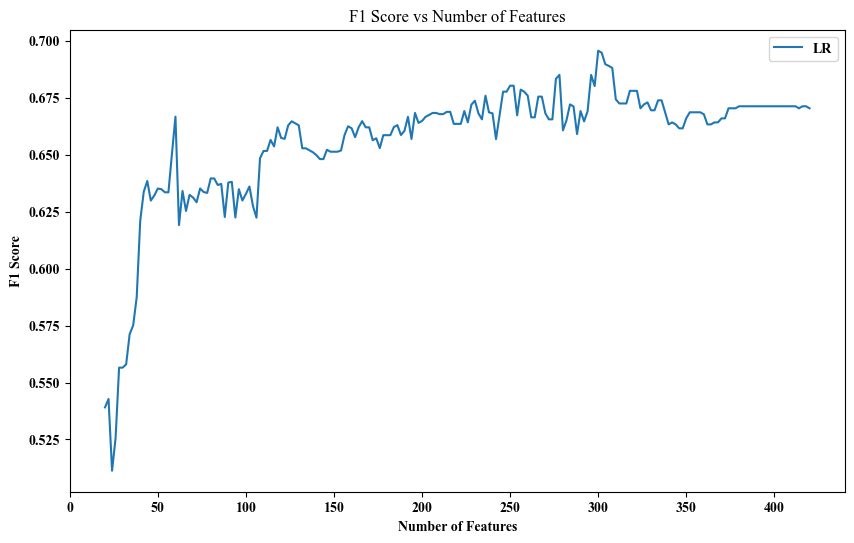

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


In [41]:
# 调用特征选择函数
xTrainRFE, xTestRFE = featureSelect111(xTrain, xTest, yTrain, yTest, 420, 2, 42,columnNames)

In [42]:
pd.DataFrame(xTrainRFE)

,Fp1_Mean,Fpz_Mean,Fp2_Mean,F7_Mean,F3_Mean,Fz_Mean,F4_Mean,F8_Mean,FC5_Mean,FC1_Mean,...,CP6_PSD_Beta,P7_PSD_Beta,P3_PSD_Beta,Pz_PSD_Beta,P4_PSD_Beta,P8_PSD_Beta,POz_PSD_Beta,O1_PSD_Beta,Oz_PSD_Beta,O2_PSD_Beta
0,0.494232,0.499340,0.557914,0.761785,0.772790,0.475197,-1.115955,2.608878,-1.584701,-1.374644,...,-0.452582,-0.530093,-0.776779,0.033140,-0.174537,-0.471957,0.036515,-0.677996,-0.546772,-0.829450
1,-0.145192,-0.326099,-0.253320,0.072922,0.018977,-0.059598,0.268295,0.151678,0.405931,0.260966,...,-0.887967,-0.118635,0.674111,-0.407586,-0.648099,1.248590,-0.638734,-0.102665,0.337028,0.246359
2,-0.280075,-0.589543,0.313935,0.160659,0.899810,0.712224,-1.255096,1.069426,-1.122010,-0.338360,...,-0.671760,-0.399786,-0.105552,-0.269288,-0.271284,-0.006093,-0.205471,-0.028810,0.482598,0.435630
3,0.097564,-0.024454,-0.013034,0.018241,-0.053386,0.070889,0.242705,-0.035227,0.151357,0.023901,...,-0.307004,-0.239471,-0.959840,-0.105858,-0.618384,-1.201001,-0.384737,-0.641605,-0.517955,-0.733580
4,1.837719,1.942761,0.661068,0.354150,0.299879,0.136757,-0.331608,-0.033517,-0.179215,-0.624680,...,0.178850,1.157950,0.884434,0.182504,0.794675,2.541196,-0.028788,1.616918,2.082935,1.975959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1951,-0.004733,0.065528,-0.307320,0.118279,0.257050,-0.353685,-0.326426,0.267260,-0.040973,-0.036976,...,0.092537,0.033993,0.123020,0.467681,0.354964,0.865618,0.599734,0.344451,0.002510,0.500897
1952,-0.703562,-0.786224,-1.035502,-0.472198,0.150749,-0.550491,0.587974,0.074636,0.383041,0.588664,...,-0.611681,-0.601170,-0.248650,-0.181561,-0.178846,-1.021662,-0.028416,0.208954,-0.062526,-0.297981
1953,0.059758,0.000103,-0.020597,0.017881,-0.222386,0.188833,0.602544,-0.130514,0.315107,0.043640,...,0.911749,1.546103,1.388610,0.239504,0.375758,0.095140,-0.438824,-0.295246,0.757274,1.659228
1954,0.379458,0.312237,-1.724384,-0.601981,-0.862099,-2.359011,1.297084,-0.932169,0.996480,1.296156,...,2.388569,3.566120,0.923488,0.090333,1.711271,0.355574,0.315627,0.335782,0.737723,0.897611


In [43]:
# 调用样本均衡函数
xTrainResample, yTrainResample = resampleFunction(xTrainRFE, yTrain, 42)

In [44]:
pd.DataFrame(xTrainRFE)

,Fp1_Mean,Fpz_Mean,Fp2_Mean,F7_Mean,F3_Mean,Fz_Mean,F4_Mean,F8_Mean,FC5_Mean,FC1_Mean,...,CP6_PSD_Beta,P7_PSD_Beta,P3_PSD_Beta,Pz_PSD_Beta,P4_PSD_Beta,P8_PSD_Beta,POz_PSD_Beta,O1_PSD_Beta,Oz_PSD_Beta,O2_PSD_Beta
0,0.494232,0.499340,0.557914,0.761785,0.772790,0.475197,-1.115955,2.608878,-1.584701,-1.374644,...,-0.452582,-0.530093,-0.776779,0.033140,-0.174537,-0.471957,0.036515,-0.677996,-0.546772,-0.829450
1,-0.145192,-0.326099,-0.253320,0.072922,0.018977,-0.059598,0.268295,0.151678,0.405931,0.260966,...,-0.887967,-0.118635,0.674111,-0.407586,-0.648099,1.248590,-0.638734,-0.102665,0.337028,0.246359
2,-0.280075,-0.589543,0.313935,0.160659,0.899810,0.712224,-1.255096,1.069426,-1.122010,-0.338360,...,-0.671760,-0.399786,-0.105552,-0.269288,-0.271284,-0.006093,-0.205471,-0.028810,0.482598,0.435630
3,0.097564,-0.024454,-0.013034,0.018241,-0.053386,0.070889,0.242705,-0.035227,0.151357,0.023901,...,-0.307004,-0.239471,-0.959840,-0.105858,-0.618384,-1.201001,-0.384737,-0.641605,-0.517955,-0.733580
4,1.837719,1.942761,0.661068,0.354150,0.299879,0.136757,-0.331608,-0.033517,-0.179215,-0.624680,...,0.178850,1.157950,0.884434,0.182504,0.794675,2.541196,-0.028788,1.616918,2.082935,1.975959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1951,-0.004733,0.065528,-0.307320,0.118279,0.257050,-0.353685,-0.326426,0.267260,-0.040973,-0.036976,...,0.092537,0.033993,0.123020,0.467681,0.354964,0.865618,0.599734,0.344451,0.002510,0.500897
1952,-0.703562,-0.786224,-1.035502,-0.472198,0.150749,-0.550491,0.587974,0.074636,0.383041,0.588664,...,-0.611681,-0.601170,-0.248650,-0.181561,-0.178846,-1.021662,-0.028416,0.208954,-0.062526,-0.297981
1953,0.059758,0.000103,-0.020597,0.017881,-0.222386,0.188833,0.602544,-0.130514,0.315107,0.043640,...,0.911749,1.546103,1.388610,0.239504,0.375758,0.095140,-0.438824,-0.295246,0.757274,1.659228
1954,0.379458,0.312237,-1.724384,-0.601981,-0.862099,-2.359011,1.297084,-0.932169,0.996480,1.296156,...,2.388569,3.566120,0.923488,0.090333,1.711271,0.355574,0.315627,0.335782,0.737723,0.897611


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'boosting_type': 'goss', 'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 127}
Best score: 0.980019897347774
算法 LightGBM 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 LightGBM 在测试集中的表现如下 Accuracy: 0.884 macro-Precision: 0.812 macro-Recall: 0.78 macro-F1: 0.783 macro-AUC: 0.942
模型的准确率为： 0.8843861740166865
模型的评估报告：
               precision    recall  f1-score   support

           0       0.74      0.87      0.80        23
           1       0.79      0.50      0.62       145
           2       0.90      0.97      0.93       671

    accuracy                           0.88       839
   macro avg       0.81      0.78      0.78       839
weighted avg       0.88      0.88      0.87       839



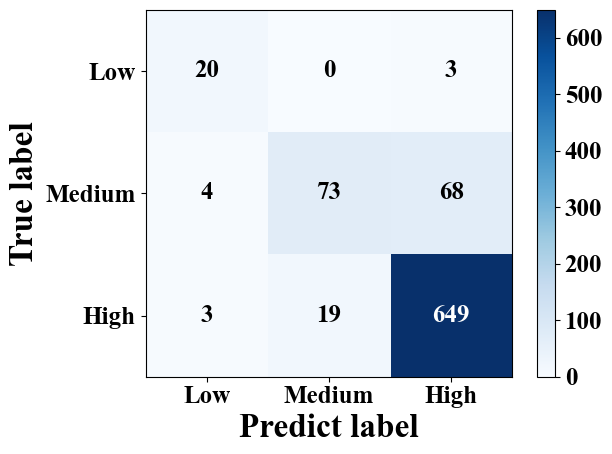

-----------------------------------------------------------------


LGBMClassifier(boosting_type='goss', n_estimators=200, num_leaves=127,
               random_state=42)

In [45]:
# 存放所有 seed 下结果的列表
resultList = []
# 存储结果信息
listInfo = []
# 调用 模型训练 & 测试集拟合 函数
lightGBM(xTrainResample, yTrainResample, xTestRFE, yTest, \
                     listInfo, 42, 'EEG')

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 150}
Best score: 0.9759809618558799
算法 RF 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 RF 在测试集中的表现如下 Accuracy: 0.871 macro-Precision: 0.801 macro-Recall: 0.758 macro-F1: 0.765 macro-AUC: 0.945
模型的准确率为： 0.8712753277711561
模型的评估报告：
               precision    recall  f1-score   support

           0       0.77      0.87      0.82        23
           1       0.74      0.44      0.55       145
           2       0.89      0.96      0.93       671

    accuracy                           0.87       839
   macro avg       0.80      0.76      0.77       839
weighted avg       0.86      0.87      0.86       839



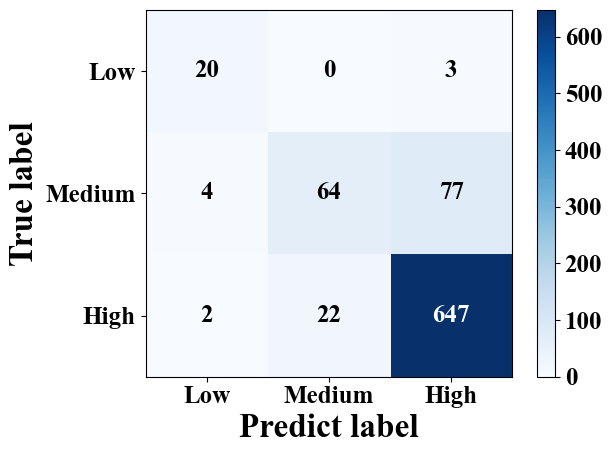

-----------------------------------------------------------------


RandomForestClassifier(max_features='auto', min_samples_split=5,
                       n_estimators=150, random_state=42)

In [46]:
# 存放所有 seed 下结果的列表
resultList = []
# 存储结果信息
listInfo = []
# 调用 模型训练 & 测试集拟合 函数
randomForest(xTrainResample, yTrainResample, xTestRFE, yTest, \
                     listInfo, 42, 'EEG')

# 结果格式转换

In [47]:
def resultTransfer(listInfo, dataType):
    # 转换为DataFrame操作
    data = pd.DataFrame(listInfo, columns=['Algorithm', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'AUC', 'BestParams'])
    
    # 截取 Accuracy 
    subData1 = data.loc[:,['Algorithm', 'Accuracy', 'BestParams']]
    subData1.insert(2, 'ValueType', 'ACC')
    subData1.rename(columns = {"Accuracy": "Value"}, inplace=True)
    
    # 截取 Precison 
    subData2 = data.loc[:,['Algorithm', 'Precision', 'BestParams']]
    subData2.insert(2, 'ValueType', 'Precision')
    subData2.rename(columns = {"Precision": "Value"}, inplace=True)
    
    # 截取 Recall 
    subData3 = data.loc[:,['Algorithm', 'Recall', 'BestParams']]
    subData3.insert(2, 'ValueType', 'Recall')
    subData3.rename(columns = {"Recall": "Value"}, inplace=True)
    
    # 截取 F1-score 
    subData4 = data.loc[:,['Algorithm', 'F1-score', 'BestParams']]
    subData4.insert(2, 'ValueType', 'F1-score')
    subData4.rename(columns = {"F1-score": "Value"}, inplace=True)
    
    # 截取 AUC
    subData5 = data.loc[:,['Algorithm', 'AUC', 'BestParams']]
    subData5.insert(2, 'ValueType', 'AUC')
    subData5.rename(columns = {"AUC": "Value"}, inplace=True)
    
    # 拼凑两个子DF
    dataNew = pd.concat([subData1, subData2, subData3, subData4, subData5]).reset_index(drop=True)
    
    # 标明这是哪种数据
    dataNew['DataType'] = dataType
    
    return dataNew

# 步骤整合

In [48]:
# 将训练集测试集划分 特征选择 样本均衡 模型训练 测试集拟合 结果返回 这些步骤都整合到一个函数里直接调用
# 没必要每次都调用n次函数

In [49]:
import os

In [50]:
def stepIntegrationTest(features, label):
    # 调用训练集测试集划分函数
    xTrain, xTest, yTrain, yTest = dataSplitStandard(features, label, 42)
    columnNames = chEEGFeatures.columns  # 获取原始数据的列名
    if xTrain.shape[1] > 20:
        # 调用特征选择函数
        xTrainRFE, xTestRFE = featureSelect111(xTrain, xTest, yTrain, yTest, 420, 2, 42,columnNames)
    else :
        xTrainRFE, xTestRFE = xTrain, xTest
        
    # 调用样本均衡函数
    xTrainResample, yTrainResample = resampleFunction(xTrainRFE, yTrain, 42)
    # 打印特征信息
    print(xTrainResample.columns)
    
    return xTrainResample, yTrainResample, xTest, yTest

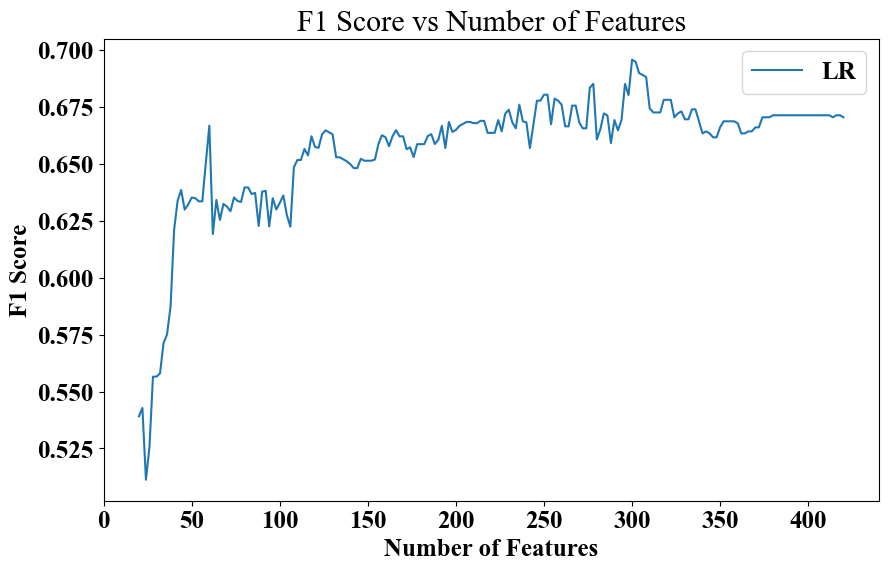

Best Algorithm: LR
Best F1 Score: 0.6956202077234587
Index(['Fp1_Mean', 'Fpz_Mean', 'Fp2_Mean', 'F7_Mean', 'F3_Mean', 'Fz_Mean',
       'F4_Mean', 'F8_Mean', 'FC5_Mean', 'FC1_Mean',
       ...
       'CP6_PSD_Beta', 'P7_PSD_Beta', 'P3_PSD_Beta', 'Pz_PSD_Beta',
       'P4_PSD_Beta', 'P8_PSD_Beta', 'POz_PSD_Beta', 'O1_PSD_Beta',
       'Oz_PSD_Beta', 'O2_PSD_Beta'],
      dtype='object', length=300)


In [51]:
xTrainResample, yTrainResample, xTest, yTest = stepIntegrationTest(chEEGFeatures, TrustLabel)

In [52]:
pd.DataFrame(yTrainResample).value_counts()

0    1568
1    1568
2    1568
dtype: int64

In [53]:
pd.DataFrame(yTest).value_counts()

2    671
1    145
0     23
dtype: int64

In [54]:
def stepIntegration(features, label, dataType):
    # 调用训练集测试集划分函数
    xTrain, xTest, yTrain, yTest = dataSplitStandard111(features, label, 42)
    columnNames = chEEGFeatures.columns  # 获取原始数据的列名
    if xTrain.shape[1] > 20:
        # 调用特征选择函数
        xTrainRFE, xTestRFE = featureSelect111(xTrain, xTest, yTrain, yTest,len(features.columns),2, 42,columnNames)
    else :
        xTrainRFE, xTestRFE = xTrain, xTest
        
    # 调用样本均衡函数
    xTrainResample, yTrainResample = resampleFunction(xTrainRFE, yTrain, 42)
    # 打印特征信息
    print(xTrainResample.columns)
    
# 存放所有 seed 下结果的列表
    resultList = [] 
    seed = 42
 # 存储结果信息
    listInfo = []
# 调用 模型训练 & 测试集拟合 函数
    tree_best, knn_best, svm_best, rf_best, ada_best, gbdt_best, xgboost_best, \
    lgb_best, mlp_best = initMain(xTrainResample, yTrainResample, xTestRFE, yTest, listInfo, seed, dataType)
# 调用函数
    dataNew = resultTransfer(listInfo, dataType)
    dataNew['Seed'] = seed
# 结果信息存放
    resultList.append(dataNew)
    resultInfo = pd.concat(resultList, axis=0, ignore_index=True)
# 输出文件路径
    outputPath = 'D:/Win_Step/Result/LRC0.1/{0}.csv'.format(dataType)
    
    if os.path.exists(outputPath):
        # 将结果数据保存到输出文件路径，覆盖原有文件
        resultInfo.to_csv(outputPath, index=False, mode='w')
    # 返回结果信息
    return resultInfo

# 模型训练&测试集拟合

## 单模态

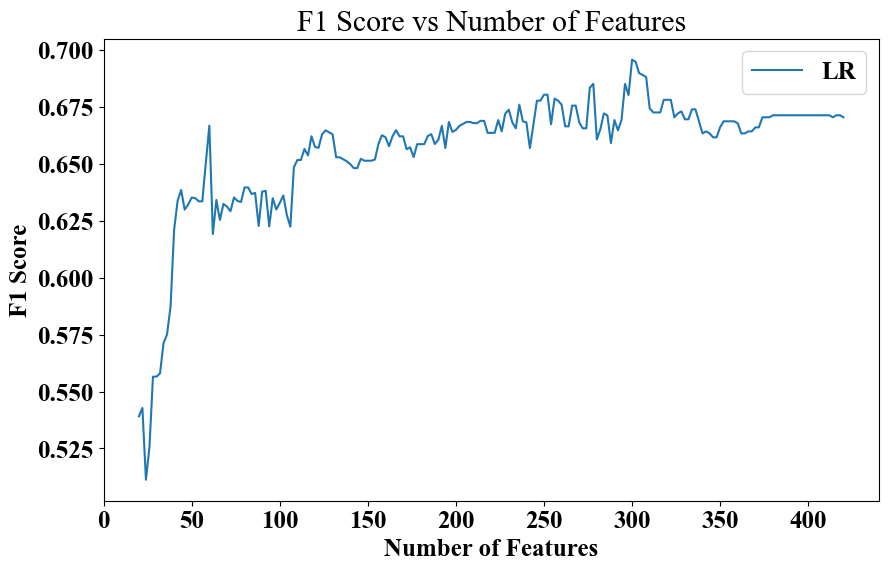

Best Algorithm: LR
Best F1 Score: 0.6956202077234587
Index(['Fp1_Mean', 'Fpz_Mean', 'Fp2_Mean', 'F7_Mean', 'F3_Mean', 'Fz_Mean',
       'F4_Mean', 'F8_Mean', 'FC5_Mean', 'FC1_Mean',
       ...
       'CP6_PSD_Beta', 'P7_PSD_Beta', 'P3_PSD_Beta', 'Pz_PSD_Beta',
       'P4_PSD_Beta', 'P8_PSD_Beta', 'POz_PSD_Beta', 'O1_PSD_Beta',
       'Oz_PSD_Beta', 'O2_PSD_Beta'],
      dtype='object', length=300)
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best score: 0.7848689714427838
算法 DT 在训练集中的表现如下 Accuracy: 0.86 macro-Precision: 0.874 macro-Recall: 0.86 macro-F1: 0.86 macro-AUC: 0.954
算法 DT 在测试集中的表现如下 Accuracy: 0.626 macro-Precision: 0.483 macro-Recall: 0.585 macro-F1: 0.501 macro-AUC: 0.721
模型的准确率为： 0.6257449344457687
模型的评估报告：
               precision    recall  f1-score   support

           0       0.32      0.57      0.41        23
           1       0.26      0.54      0.36       145
         

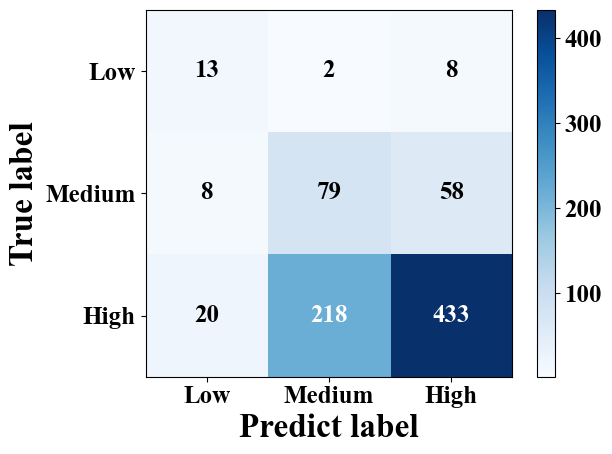

-----------------------------------------------------------------
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best score: 0.9251710493589889
算法 KNN 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 KNN 在测试集中的表现如下 Accuracy: 0.809 macro-Precision: 0.634 macro-Recall: 0.861 macro-F1: 0.699 macro-AUC: 0.929
模型的准确率为： 0.8092967818831943
模型的评估报告：
               precision    recall  f1-score   support

           0       0.43      1.00      0.61        23
           1       0.50      0.77      0.61       145
           2       0.96      0.81      0.88       671

    accuracy                           0.81       839
   macro avg       0.63      0.86      0.70       839
weighted avg       0.87      0.81      0.83       839



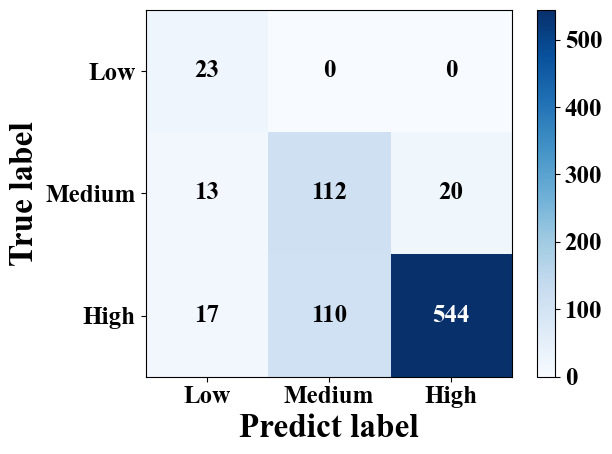

-----------------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best score: 0.9632254052954078
算法 SVM 在训练集中的表现如下 Accuracy: 0.991 macro-Precision: 0.991 macro-Recall: 0.991 macro-F1: 0.991 macro-AUC: 0.999
算法 SVM 在测试集中的表现如下 Accuracy: 0.858 macro-Precision: 0.784 macro-Recall: 0.766 macro-F1: 0.774 macro-AUC: 0.913
模型的准确率为： 0.8581644815256257
模型的评估报告：
               precision    recall  f1-score   support

           0       0.83      0.83      0.83        23
           1       0.62      0.54      0.58       145
           2       0.90      0.93      0.91       671

    accuracy                           0.86       839
   macro avg       0.78      0.77      0.77       839
weighted avg       0.85      0.86      0.85       839



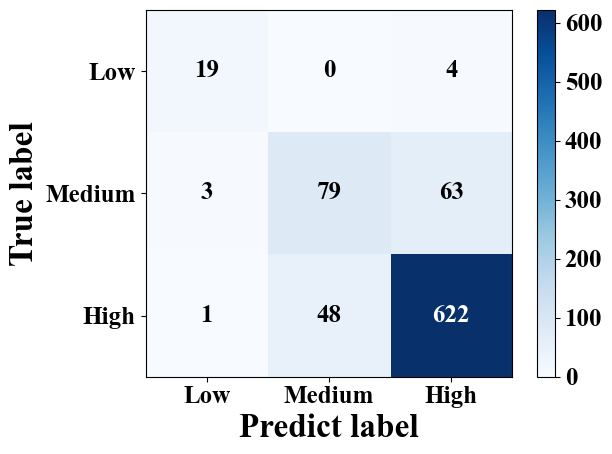

-----------------------------------------------------------------
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 150}
Best score: 0.9759809618558799
算法 RF 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 RF 在测试集中的表现如下 Accuracy: 0.871 macro-Precision: 0.801 macro-Recall: 0.758 macro-F1: 0.765 macro-AUC: 0.945
模型的准确率为： 0.8712753277711561
模型的评估报告：
               precision    recall  f1-score   support

           0       0.77      0.87      0.82        23
           1       0.74      0.44      0.55       145
           2       0.89      0.96      0.93       671

    accuracy                           0.87       839
   macro avg       0.80      0.76      0.77       839
weighted avg       0.86      0.87      0.86       839



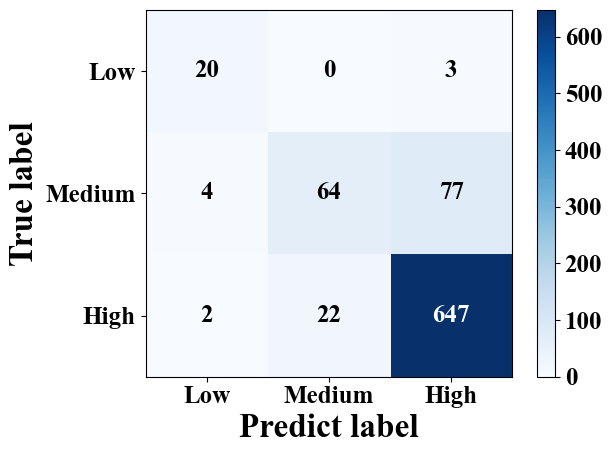

-----------------------------------------------------------------
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.1, 'n_estimators': 50}
Best score: 0.8762830397720849
算法 AdaBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 AdaBoost 在测试集中的表现如下 Accuracy: 0.735 macro-Precision: 0.52 macro-Recall: 0.616 macro-F1: 0.553 macro-AUC: 0.712
模型的准确率为： 0.735399284862932
模型的评估报告：
               precision    recall  f1-score   support

           0       0.33      0.61      0.43        23
           1       0.36      0.43      0.39       145
           2       0.87      0.80      0.84       671

    accuracy                           0.74       839
   macro avg       0.52      0.62      0.55       839
weighted avg       0.77      0.74      0.75       839



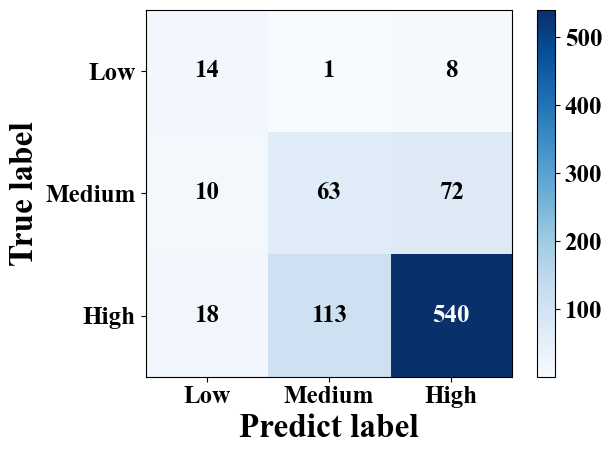

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'learning_rate': 0.5, 'max_depth': 5, 'min_samples_split': 8, 'n_estimators': 200}
Best score: 0.9721529834716349
算法 GBDT 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 GBDT 在测试集中的表现如下 Accuracy: 0.877 macro-Precision: 0.776 macro-Recall: 0.797 macro-F1: 0.782 macro-AUC: 0.941
模型的准确率为： 0.8772348033373063
模型的评估报告：
               precision    recall  f1-score   support

           0       0.71      0.87      0.78        23
           1       0.70      0.58      0.63       145
           2       0.91      0.94      0.93       671

    accuracy                           0.88       839
   macro avg       0.78      0.80      0.78       839
weighted avg       0.87      0.88      0.87       839



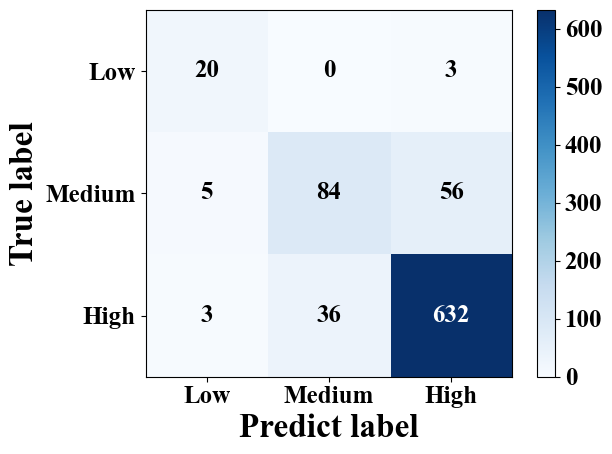

-----------------------------------------------------------------
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 200}
Best score: 0.9757679697922084
算法 XGBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 XGBoost 在测试集中的表现如下 Accuracy: 0.869 macro-Precision: 0.758 macro-Recall: 0.765 macro-F1: 0.755 macro-AUC: 0.936
模型的准确率为： 0.8688915375446961
模型的评估报告：
               precision    recall  f1-score   support

           0       0.68      0.83      0.75        23
           1       0.69      0.52      0.60       145
           2       0.90      0.94      0.92       671

    accuracy                           0.87       839
   macro avg       0.76      0.77      0.76       839
weighted avg       0.86      0.87      0.86       839



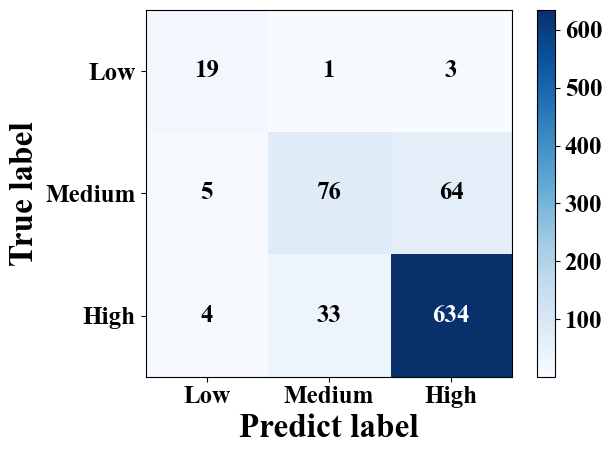

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'boosting_type': 'goss', 'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 127}
Best score: 0.980019897347774
算法 LightGBM 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 LightGBM 在测试集中的表现如下 Accuracy: 0.884 macro-Precision: 0.812 macro-Recall: 0.78 macro-F1: 0.783 macro-AUC: 0.942
模型的准确率为： 0.8843861740166865
模型的评估报告：
               precision    recall  f1-score   support

           0       0.74      0.87      0.80        23
           1       0.79      0.50      0.62       145
           2       0.90      0.97      0.93       671

    accuracy                           0.88       839
   macro avg       0.81      0.78      0.78       839
weighted avg       0.88      0.88      0.87       839



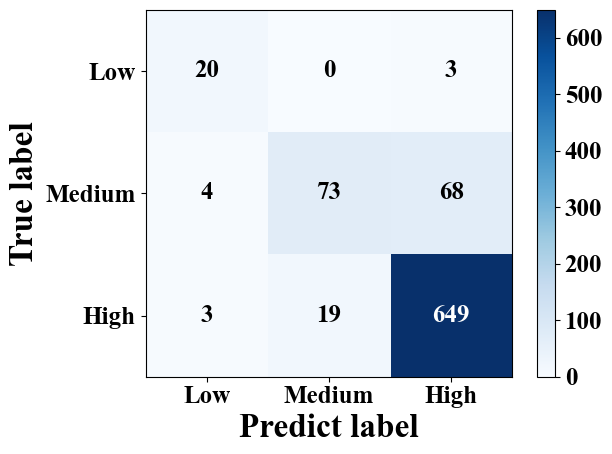

-----------------------------------------------------------------
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters: {'activation': 'relu', 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'solver': 'adam'}
Best score: 0.9698139145770682
算法 MLP 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 MLP 在测试集中的表现如下 Accuracy: 0.853 macro-Precision: 0.731 macro-Recall: 0.792 macro-F1: 0.755 macro-AUC: 0.916
模型的准确率为： 0.8533969010727056
模型的评估报告：
               precision    recall  f1-score   support

           0       0.68      0.91      0.78        23
           1       0.61      0.54      0.57       145
           2       0.91      0.92      0.91       671

    accuracy                           0.85       839
   macro avg       0.73      0.79      0.76       839
weighted avg       0.85      0.85      0.85       839



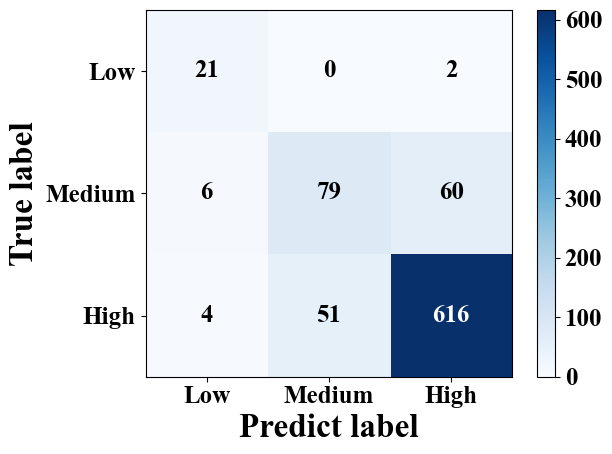

-----------------------------------------------------------------


In [55]:
# 脑电
chEEGResultInfo = stepIntegration(chEEGFeatures, TrustLabel, 'EEG')

In [56]:
chEEGResultInfo

,Algorithm,Value,ValueType,BestParams,DataType,Seed
0,DT,0.625745,ACC,"{'max_depth': 7, 'min_samples_leaf': 1, 'min_s...",EEG,42
1,KNN,0.809297,ACC,"{'n_neighbors': 3, 'p': 1, 'weights': 'distance'}",EEG,42
2,SVM,0.858164,ACC,"{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}",EEG,42
3,RF,0.871275,ACC,"{'max_depth': None, 'max_features': 'auto', 'm...",EEG,42
4,AdaBoost,0.735399,ACC,"{'algorithm': 'SAMME', 'learning_rate': 0.1, '...",EEG,42
5,GBDT,0.877235,ACC,"{'learning_rate': 0.5, 'max_depth': 5, 'min_sa...",EEG,42
6,XGBoost,0.868892,ACC,"{'learning_rate': 0.2, 'max_depth': 6, 'n_esti...",EEG,42
7,LightGBM,0.884386,ACC,"{'boosting_type': 'goss', 'learning_rate': 0.1...",EEG,42
8,MLP,0.853397,ACC,"{'activation': 'relu', 'hidden_layer_sizes': (...",EEG,42
9,DT,0.483008,Precision,"{'max_depth': 7, 'min_samples_leaf': 1, 'min_s...",EEG,42


In [57]:
chEEGResultInfo.to_csv('D:/Win_Step/Result/LRC0.1/EEG.csv', index=False, mode='w')

### EEG拆分

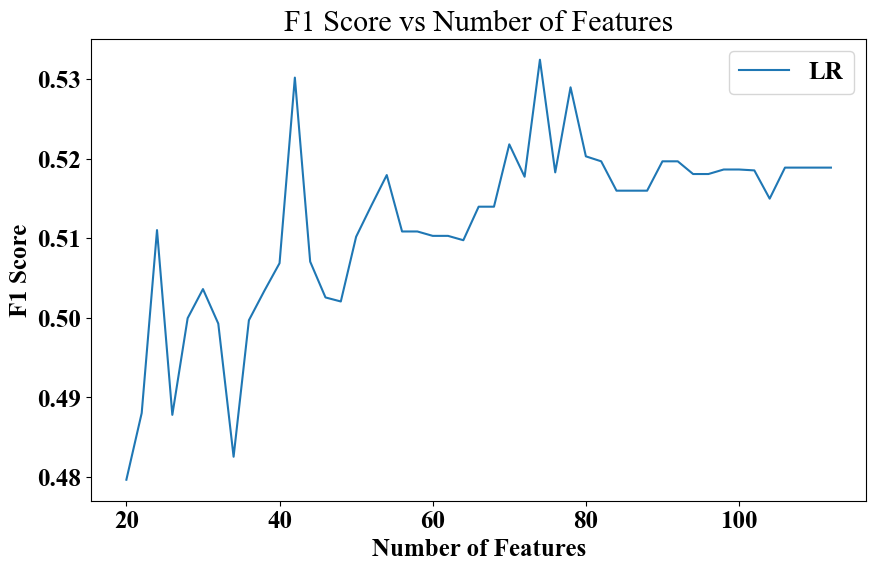

Best Algorithm: LR
Best F1 Score: 0.5324389999799836
Index(['Fp1_Mean', 'Fpz_Mean', 'Fp2_Mean', 'F7_Mean', 'F3_Mean', 'Fz_Mean',
       'F4_Mean', 'F8_Mean', 'FC5_Mean', 'FC1_Mean', 'FC2_Mean', 'FC6_Mean',
       'T7_Mean', 'C3_Mean', 'Cz_Mean', 'C4_Mean', 'T8_Mean', 'CP5_Mean',
       'CP1_Mean', 'CP2_Mean', 'CP6_Mean', 'P7_Mean', 'P3_Mean', 'Pz_Mean',
       'P4_Mean', 'P8_Mean', 'POz_Mean', 'O1_Mean', 'Oz_Mean', 'O2_Mean',
       'Fp1_Std', 'Fpz_Std', 'Fp2_Std', 'F7_Std', 'F3_Std', 'Fz_Std', 'F4_Std',
       'F8_Std', 'FC5_Std', 'FC1_Std', 'FC2_Std', 'FC6_Std', 'T7_Std',
       'C3_Std', 'Cz_Std', 'C4_Std', 'T8_Std', 'CP5_Std', 'CP1_Std', 'CP2_Std',
       'CP6_Std', 'P7_Std', 'P3_Std', 'Pz_Std', 'P4_Std', 'P8_Std', 'POz_Std',
       'O1_Std', 'Oz_Std', 'O2_Std', 'Fp1_Min', 'Fpz_Min', 'Fp2_Min', 'F7_Min',
       'F3_Min', 'Fz_Min', 'F4_Min', 'F8_Min', 'FC5_Min', 'FC1_Min', 'FC2_Min',
       'FC6_Min', 'T7_Min', 'C3_Min'],
      dtype='object')
Fitting 5 folds for each of 27 candidat

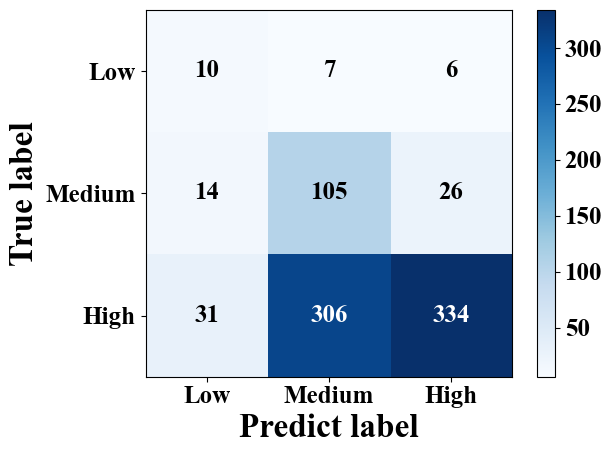

-----------------------------------------------------------------
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best score: 0.928572139190992
算法 KNN 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 KNN 在测试集中的表现如下 Accuracy: 0.795 macro-Precision: 0.606 macro-Recall: 0.823 macro-F1: 0.665 macro-AUC: 0.91
模型的准确率为： 0.7949940405244339
模型的评估报告：
               precision    recall  f1-score   support

           0       0.38      0.96      0.54        23
           1       0.49      0.70      0.58       145
           2       0.95      0.81      0.87       671

    accuracy                           0.79       839
   macro avg       0.61      0.82      0.67       839
weighted avg       0.85      0.79      0.81       839



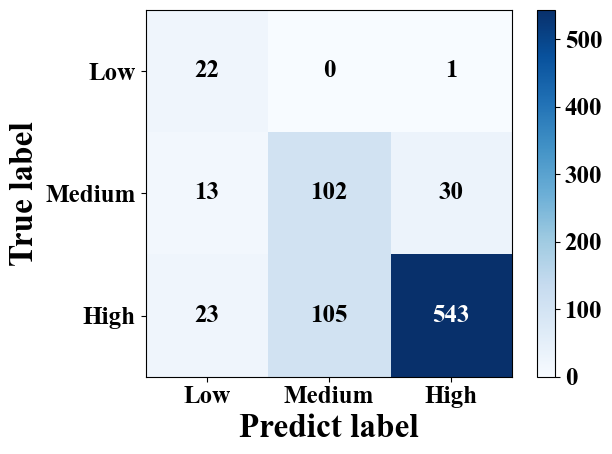

-----------------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best score: 0.9358021118321387
算法 SVM 在训练集中的表现如下 Accuracy: 0.966 macro-Precision: 0.966 macro-Recall: 0.966 macro-F1: 0.966 macro-AUC: 0.995
算法 SVM 在测试集中的表现如下 Accuracy: 0.833 macro-Precision: 0.651 macro-Recall: 0.707 macro-F1: 0.675 macro-AUC: 0.85
模型的准确率为： 0.833134684147795
模型的评估报告：
               precision    recall  f1-score   support

           0       0.48      0.65      0.56        23
           1       0.56      0.57      0.56       145
           2       0.91      0.90      0.90       671

    accuracy                           0.83       839
   macro avg       0.65      0.71      0.67       839
weighted avg       0.84      0.83      0.84       839



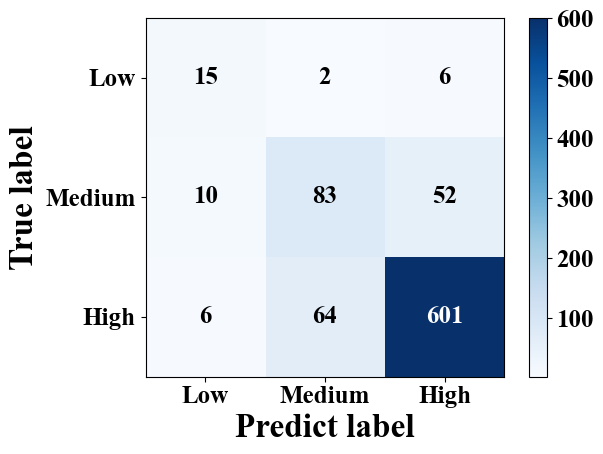

-----------------------------------------------------------------
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Best score: 0.9655644741899744
算法 RF 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 RF 在测试集中的表现如下 Accuracy: 0.859 macro-Precision: 0.723 macro-Recall: 0.743 macro-F1: 0.719 macro-AUC: 0.923
模型的准确率为： 0.8593563766388558
模型的评估报告：
               precision    recall  f1-score   support

           0       0.59      0.83      0.69        23
           1       0.68      0.46      0.55       145
           2       0.90      0.95      0.92       671

    accuracy                           0.86       839
   macro avg       0.72      0.74      0.72       839
weighted avg       0.85      0.86      0.85       839



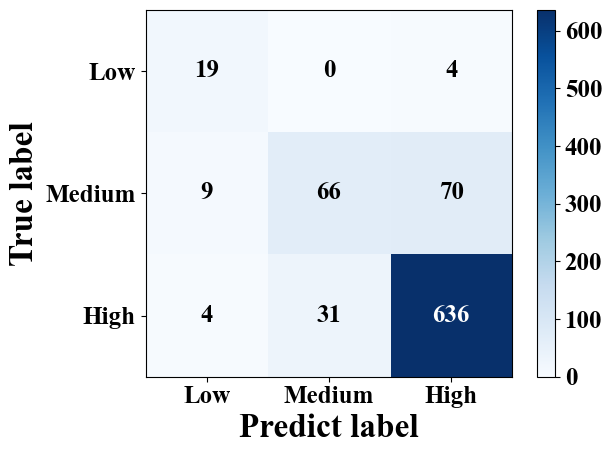

-----------------------------------------------------------------
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.1, 'n_estimators': 50}
Best score: 0.8645840775996565
算法 AdaBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 AdaBoost 在测试集中的表现如下 Accuracy: 0.749 macro-Precision: 0.52 macro-Recall: 0.629 macro-F1: 0.552 macro-AUC: 0.722
模型的准确率为： 0.7485101311084624
模型的评估报告：
               precision    recall  f1-score   support

           0       0.25      0.57      0.35        23
           1       0.41      0.52      0.46       145
           2       0.89      0.80      0.85       671

    accuracy                           0.75       839
   macro avg       0.52      0.63      0.55       839
weighted avg       0.79      0.75      0.77       839



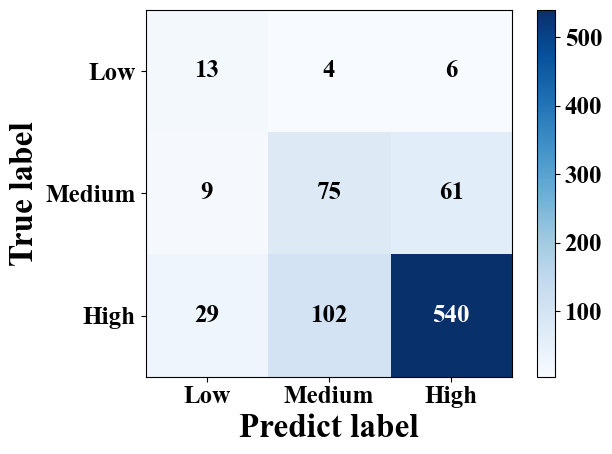

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'learning_rate': 0.5, 'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 200}
Best score: 0.9659884233612951
算法 GBDT 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 GBDT 在测试集中的表现如下 Accuracy: 0.858 macro-Precision: 0.734 macro-Recall: 0.731 macro-F1: 0.729 macro-AUC: 0.908
模型的准确率为： 0.8581644815256257
模型的评估报告：
               precision    recall  f1-score   support

           0       0.65      0.74      0.69        23
           1       0.65      0.52      0.57       145
           2       0.90      0.94      0.92       671

    accuracy                           0.86       839
   macro avg       0.73      0.73      0.73       839
weighted avg       0.85      0.86      0.85       839



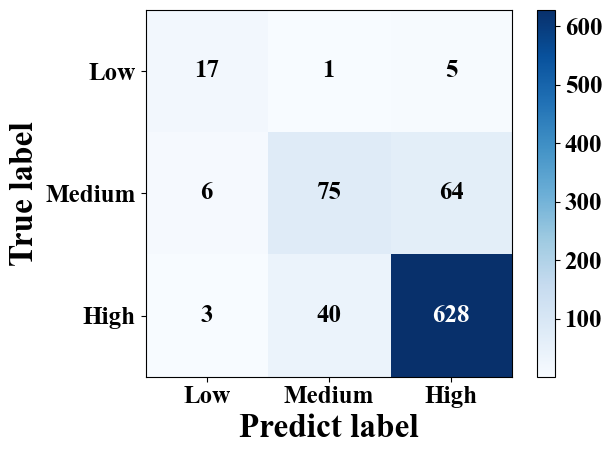

-----------------------------------------------------------------
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 200}
Best score: 0.9649257241051845
算法 XGBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 XGBoost 在测试集中的表现如下 Accuracy: 0.869 macro-Precision: 0.752 macro-Recall: 0.763 macro-F1: 0.752 macro-AUC: 0.918
模型的准确率为： 0.8688915375446961
模型的评估报告：
               precision    recall  f1-score   support

           0       0.68      0.83      0.75        23
           1       0.67      0.52      0.58       145
           2       0.91      0.95      0.93       671

    accuracy                           0.87       839
   macro avg       0.75      0.76      0.75       839
weighted avg       0.86      0.87      0.86       839



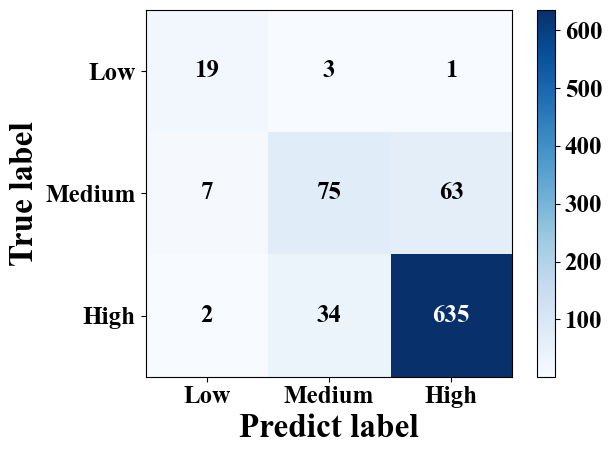

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'boosting_type': 'goss', 'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 127}
Best score: 0.9715155900241934
算法 LightGBM 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 LightGBM 在测试集中的表现如下 Accuracy: 0.877 macro-Precision: 0.762 macro-Recall: 0.763 macro-F1: 0.753 macro-AUC: 0.921
模型的准确率为： 0.8772348033373063
模型的评估报告：
               precision    recall  f1-score   support

           0       0.66      0.83      0.73        23
           1       0.72      0.50      0.59       145
           2       0.91      0.96      0.93       671

    accuracy                           0.88       839
   macro avg       0.76      0.76      0.75       839
weighted avg       0.87      0.88      0.87       839



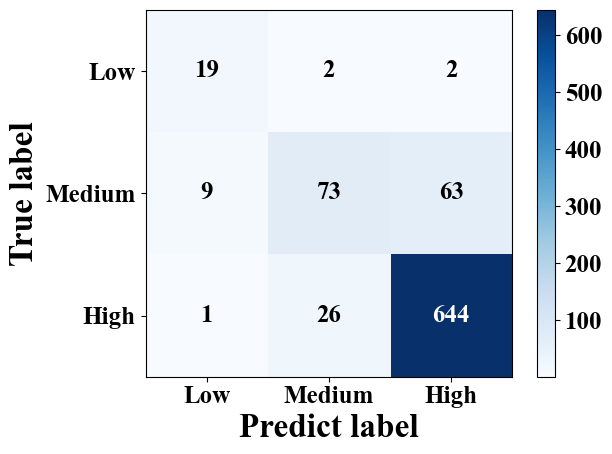

-----------------------------------------------------------------
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters: {'activation': 'relu', 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'solver': 'adam'}
Best score: 0.9630117349130621
算法 MLP 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 MLP 在测试集中的表现如下 Accuracy: 0.853 macro-Precision: 0.674 macro-Recall: 0.731 macro-F1: 0.692 macro-AUC: 0.907
模型的准确率为： 0.8533969010727056
模型的评估报告：
               precision    recall  f1-score   support

           0       0.49      0.74      0.59        23
           1       0.62      0.52      0.57       145
           2       0.91      0.93      0.92       671

    accuracy                           0.85       839
   macro avg       0.67      0.73      0.69       839
weighted avg       0.85      0.85      0.85       839



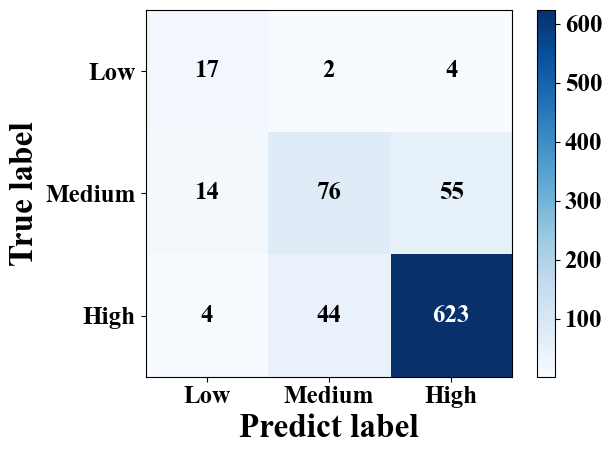

-----------------------------------------------------------------


In [58]:
# 额区
EEGEQuResultInfo = stepIntegration(EEGEQuFeatures, TrustLabel, 'EEG_EQu')

In [59]:
EEGEQuResultInfo.to_csv('D:/Win_Step/Result/LRC0.1/EEG_EQu.csv', index=False, mode='w')

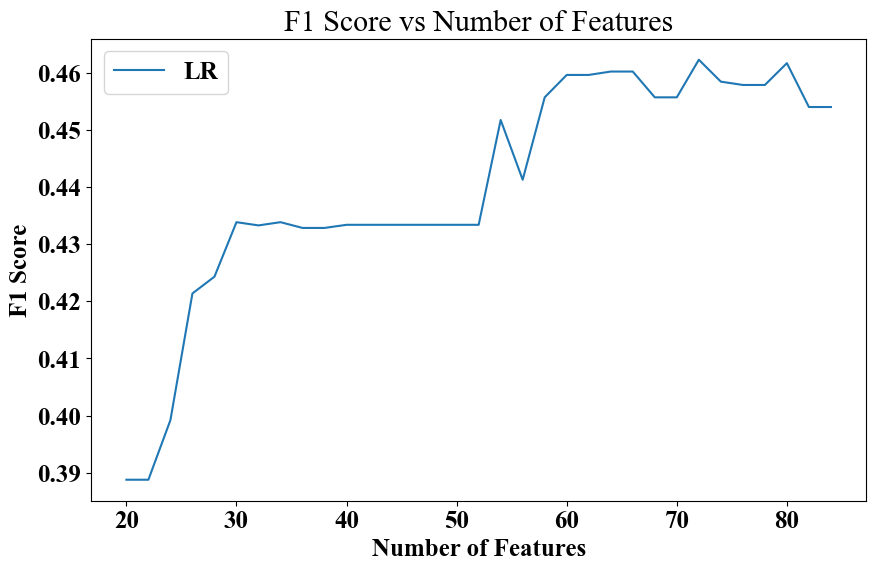

Best Algorithm: LR
Best F1 Score: 0.462292190218442
Index(['Fp1_Mean', 'Fpz_Mean', 'Fp2_Mean', 'F7_Mean', 'F3_Mean', 'Fz_Mean',
       'F4_Mean', 'F8_Mean', 'FC5_Mean', 'FC1_Mean', 'FC2_Mean', 'FC6_Mean',
       'T7_Mean', 'C3_Mean', 'Cz_Mean', 'C4_Mean', 'T8_Mean', 'CP5_Mean',
       'CP1_Mean', 'CP2_Mean', 'CP6_Mean', 'P7_Mean', 'P3_Mean', 'Pz_Mean',
       'P4_Mean', 'P8_Mean', 'POz_Mean', 'O1_Mean', 'Oz_Mean', 'O2_Mean',
       'Fp1_Std', 'Fpz_Std', 'Fp2_Std', 'F7_Std', 'F3_Std', 'Fz_Std', 'F4_Std',
       'F8_Std', 'FC5_Std', 'FC1_Std', 'FC2_Std', 'FC6_Std', 'T7_Std',
       'C3_Std', 'Cz_Std', 'C4_Std', 'T8_Std', 'CP5_Std', 'CP1_Std', 'CP2_Std',
       'CP6_Std', 'P7_Std', 'P3_Std', 'Pz_Std', 'P4_Std', 'P8_Std', 'POz_Std',
       'O1_Std', 'Oz_Std', 'O2_Std', 'Fp1_Min', 'Fpz_Min', 'Fp2_Min', 'F7_Min',
       'F3_Min', 'Fz_Min', 'F4_Min', 'F8_Min', 'FC5_Min', 'FC1_Min', 'FC2_Min',
       'FC6_Min'],
      dtype='object')
Fitting 5 folds for each of 27 candidates, totalling 135 fit

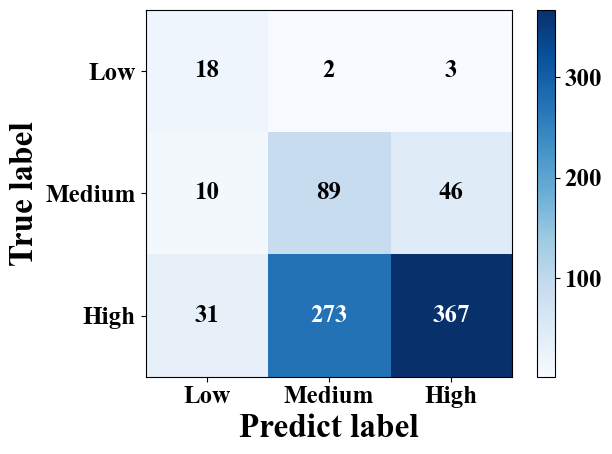

-----------------------------------------------------------------
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best score: 0.9124170755420897
算法 KNN 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 KNN 在测试集中的表现如下 Accuracy: 0.77 macro-Precision: 0.588 macro-Recall: 0.818 macro-F1: 0.645 macro-AUC: 0.898
模型的准确率为： 0.7699642431466031
模型的评估报告：
               precision    recall  f1-score   support

           0       0.36      0.96      0.52        23
           1       0.45      0.72      0.56       145
           2       0.95      0.77      0.85       671

    accuracy                           0.77       839
   macro avg       0.59      0.82      0.64       839
weighted avg       0.85      0.77      0.79       839



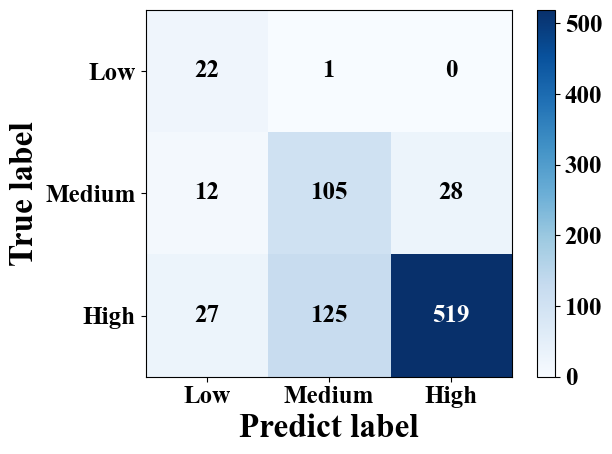

-----------------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}
Best score: 0.9351624573224502
算法 SVM 在训练集中的表现如下 Accuracy: 0.97 macro-Precision: 0.97 macro-Recall: 0.97 macro-F1: 0.97 macro-AUC: 0.995
算法 SVM 在测试集中的表现如下 Accuracy: 0.805 macro-Precision: 0.604 macro-Recall: 0.705 macro-F1: 0.64 macro-AUC: 0.86
模型的准确率为： 0.8045292014302742
模型的评估报告：
               precision    recall  f1-score   support

           0       0.42      0.74      0.54        23
           1       0.49      0.50      0.49       145
           2       0.90      0.87      0.89       671

    accuracy                           0.80       839
   macro avg       0.60      0.70      0.64       839
weighted avg       0.82      0.80      0.81       839



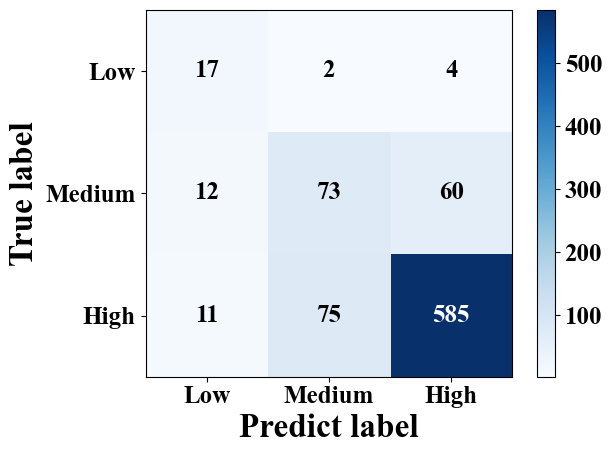

-----------------------------------------------------------------
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 150}
Best score: 0.9713028240667466
算法 RF 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 RF 在测试集中的表现如下 Accuracy: 0.851 macro-Precision: 0.742 macro-Recall: 0.731 macro-F1: 0.727 macro-AUC: 0.928
模型的准确率为： 0.8510131108462455
模型的评估报告：
               precision    recall  f1-score   support

           0       0.70      0.83      0.76        23
           1       0.64      0.42      0.51       145
           2       0.89      0.94      0.91       671

    accuracy                           0.85       839
   macro avg       0.74      0.73      0.73       839
weighted avg       0.84      0.85      0.84       839



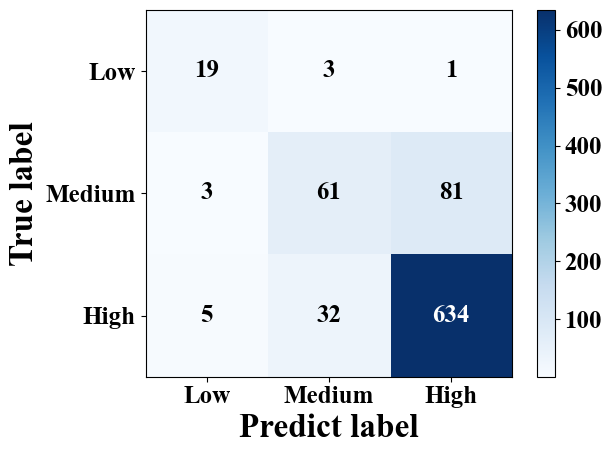

-----------------------------------------------------------------
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.1, 'n_estimators': 50}
Best score: 0.8624525742193683
算法 AdaBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 AdaBoost 在测试集中的表现如下 Accuracy: 0.733 macro-Precision: 0.52 macro-Recall: 0.643 macro-F1: 0.558 macro-AUC: 0.732
模型的准确率为： 0.733015494636472
模型的评估报告：
               precision    recall  f1-score   support

           0       0.33      0.70      0.45        23
           1       0.35      0.43      0.39       145
           2       0.88      0.80      0.84       671

    accuracy                           0.73       839
   macro avg       0.52      0.64      0.56       839
weighted avg       0.77      0.73      0.75       839



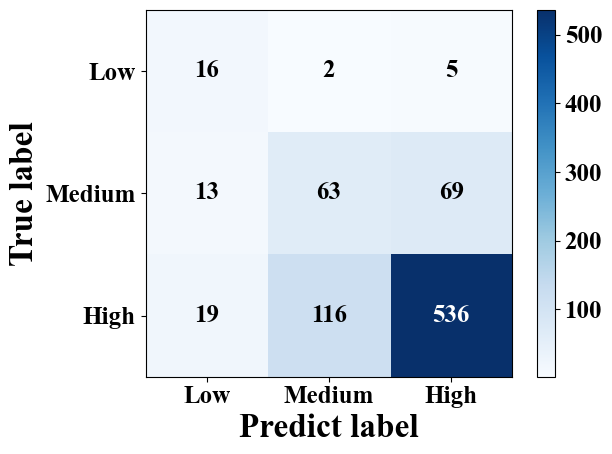

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'learning_rate': 0.5, 'max_depth': 5, 'min_samples_split': 2, 'n_estimators': 200}
Best score: 0.9608863364008412
算法 GBDT 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 GBDT 在测试集中的表现如下 Accuracy: 0.845 macro-Precision: 0.725 macro-Recall: 0.719 macro-F1: 0.717 macro-AUC: 0.902
模型的准确率为： 0.8450536352800954
模型的评估报告：
               precision    recall  f1-score   support

           0       0.69      0.78      0.73        23
           1       0.59      0.44      0.51       145
           2       0.89      0.93      0.91       671

    accuracy                           0.85       839
   macro avg       0.72      0.72      0.72       839
weighted avg       0.83      0.85      0.84       839



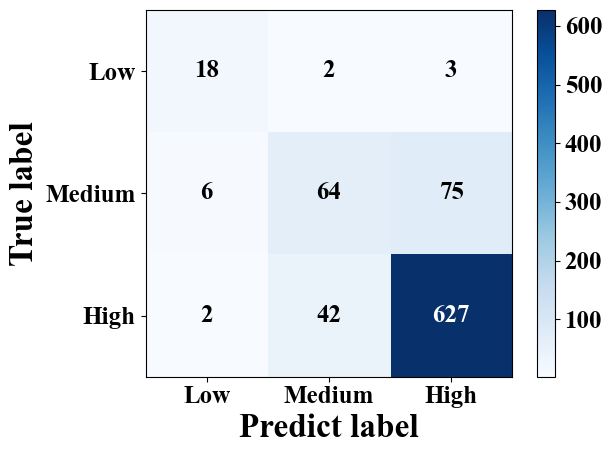

-----------------------------------------------------------------
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 200}
Best score: 0.9627994211680647
算法 XGBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 XGBoost 在测试集中的表现如下 Accuracy: 0.861 macro-Precision: 0.727 macro-Recall: 0.718 macro-F1: 0.718 macro-AUC: 0.906
模型的准确率为： 0.8605482717520858
模型的评估报告：
               precision    recall  f1-score   support

           0       0.62      0.70      0.65        23
           1       0.66      0.52      0.58       145
           2       0.90      0.94      0.92       671

    accuracy                           0.86       839
   macro avg       0.73      0.72      0.72       839
weighted avg       0.85      0.86      0.85       839



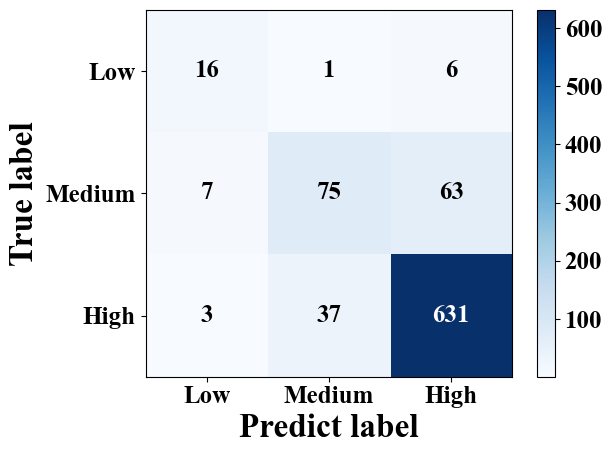

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 127}
Best score: 0.9727910552377507
算法 LightGBM 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 LightGBM 在测试集中的表现如下 Accuracy: 0.859 macro-Precision: 0.789 macro-Recall: 0.708 macro-F1: 0.738 macro-AUC: 0.914
模型的准确率为： 0.8593563766388558
模型的评估报告：
               precision    recall  f1-score   support

           0       0.81      0.74      0.77        23
           1       0.67      0.43      0.52       145
           2       0.88      0.96      0.92       671

    accuracy                           0.86       839
   macro avg       0.79      0.71      0.74       839
weighted avg       0.85      0.86      0.85       839



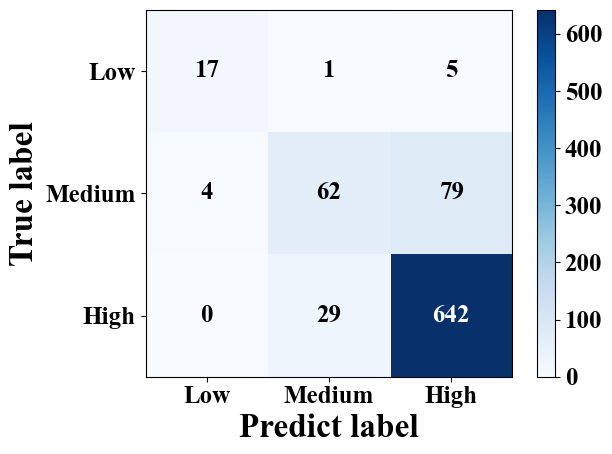

-----------------------------------------------------------------
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters: {'activation': 'relu', 'hidden_layer_sizes': (100,), 'learning_rate': 'constant', 'solver': 'adam'}
Best score: 0.9583360842924005
算法 MLP 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 MLP 在测试集中的表现如下 Accuracy: 0.82 macro-Precision: 0.633 macro-Recall: 0.718 macro-F1: 0.663 macro-AUC: 0.87
模型的准确率为： 0.8200238379022646
模型的评估报告：
               precision    recall  f1-score   support

           0       0.47      0.78      0.59        23
           1       0.53      0.48      0.50       145
           2       0.90      0.90      0.90       671

    accuracy                           0.82       839
   macro avg       0.63      0.72      0.66       839
weighted avg       0.82      0.82      0.82       839



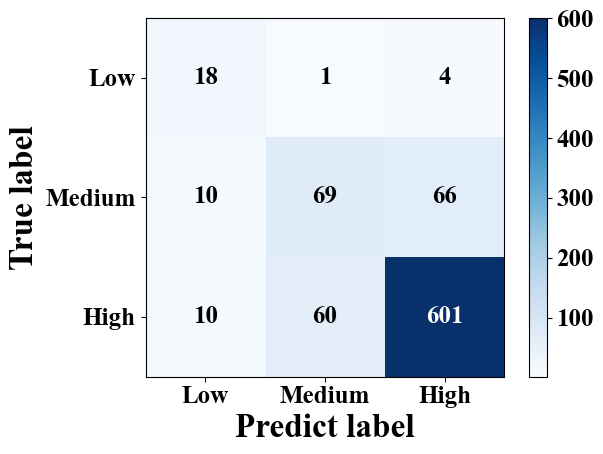

-----------------------------------------------------------------


In [60]:
# 颞区
EEGNieQuResultInfo = stepIntegration(EEGNieQuFeatures, TrustLabel, 'EEG_NieQu')

In [61]:
EEGNieQuResultInfo.to_csv('D:/Win_Step/Result/LRC0.1/EEG_NieQu.csv', index=False, mode='w')

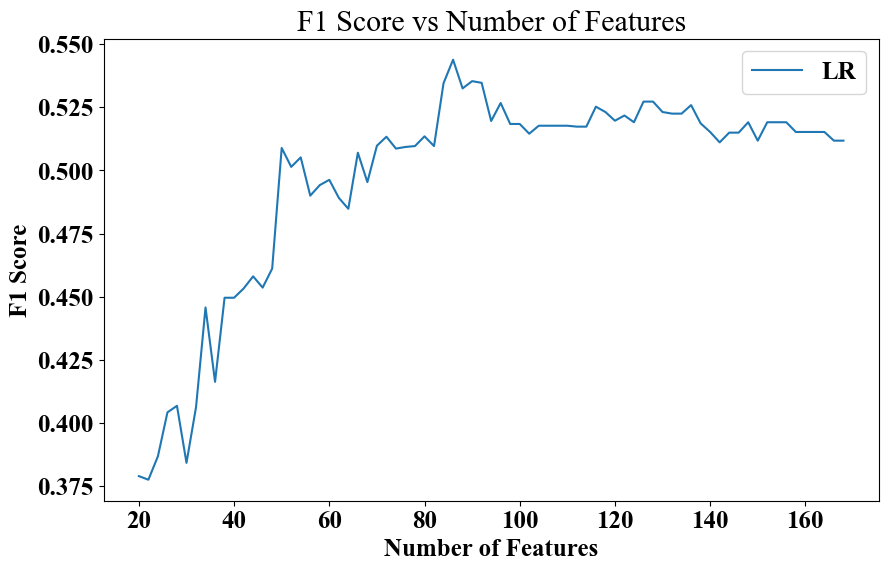

Best Algorithm: LR
Best F1 Score: 0.5438080982038641
Index(['Fp1_Mean', 'Fpz_Mean', 'Fp2_Mean', 'F7_Mean', 'F3_Mean', 'Fz_Mean',
       'F4_Mean', 'F8_Mean', 'FC5_Mean', 'FC1_Mean', 'FC2_Mean', 'FC6_Mean',
       'T7_Mean', 'C3_Mean', 'Cz_Mean', 'C4_Mean', 'T8_Mean', 'CP5_Mean',
       'CP1_Mean', 'CP2_Mean', 'CP6_Mean', 'P7_Mean', 'P3_Mean', 'Pz_Mean',
       'P4_Mean', 'P8_Mean', 'POz_Mean', 'O1_Mean', 'Oz_Mean', 'O2_Mean',
       'Fp1_Std', 'Fpz_Std', 'Fp2_Std', 'F7_Std', 'F3_Std', 'Fz_Std', 'F4_Std',
       'F8_Std', 'FC5_Std', 'FC1_Std', 'FC2_Std', 'FC6_Std', 'T7_Std',
       'C3_Std', 'Cz_Std', 'C4_Std', 'T8_Std', 'CP5_Std', 'CP1_Std', 'CP2_Std',
       'CP6_Std', 'P7_Std', 'P3_Std', 'Pz_Std', 'P4_Std', 'P8_Std', 'POz_Std',
       'O1_Std', 'Oz_Std', 'O2_Std', 'Fp1_Min', 'Fpz_Min', 'Fp2_Min', 'F7_Min',
       'F3_Min', 'Fz_Min', 'F4_Min', 'F8_Min', 'FC5_Min', 'FC1_Min', 'FC2_Min',
       'FC6_Min', 'T7_Min', 'C3_Min', 'Cz_Min', 'C4_Min', 'T8_Min', 'CP5_Min',
       'CP1_Min', 'CP

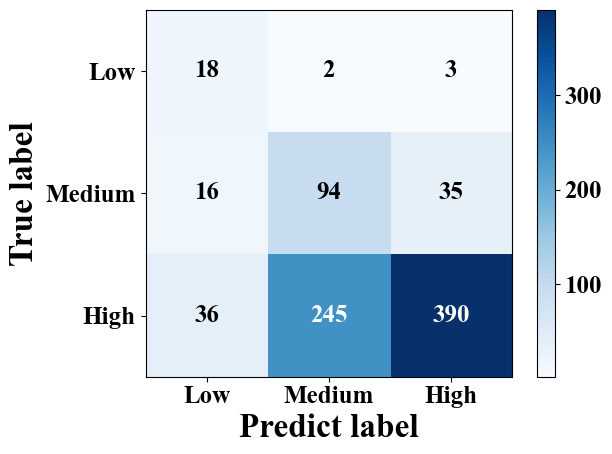

-----------------------------------------------------------------
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best score: 0.9209191218034233
算法 KNN 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 KNN 在测试集中的表现如下 Accuracy: 0.781 macro-Precision: 0.605 macro-Recall: 0.823 macro-F1: 0.664 macro-AUC: 0.911
模型的准确率为： 0.7806912991656734
模型的评估报告：
               precision    recall  f1-score   support

           0       0.41      0.96      0.57        23
           1       0.45      0.72      0.56       145
           2       0.95      0.79      0.86       671

    accuracy                           0.78       839
   macro avg       0.60      0.82      0.66       839
weighted avg       0.85      0.78      0.80       839



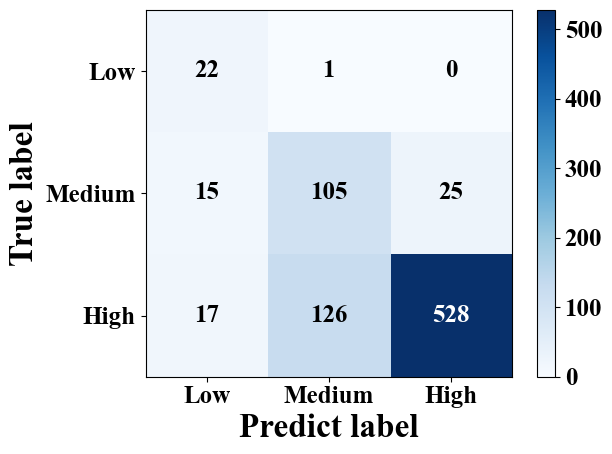

-----------------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Best score: 0.9324017003188099
算法 SVM 在训练集中的表现如下 Accuracy: 0.963 macro-Precision: 0.964 macro-Recall: 0.963 macro-F1: 0.963 macro-AUC: 0.995
算法 SVM 在测试集中的表现如下 Accuracy: 0.799 macro-Precision: 0.649 macro-Recall: 0.779 macro-F1: 0.698 macro-AUC: 0.891
模型的准确率为： 0.798569725864124
模型的评估报告：
               precision    recall  f1-score   support

           0       0.56      0.87      0.68        23
           1       0.48      0.63      0.55       145
           2       0.91      0.83      0.87       671

    accuracy                           0.80       839
   macro avg       0.65      0.78      0.70       839
weighted avg       0.83      0.80      0.81       839



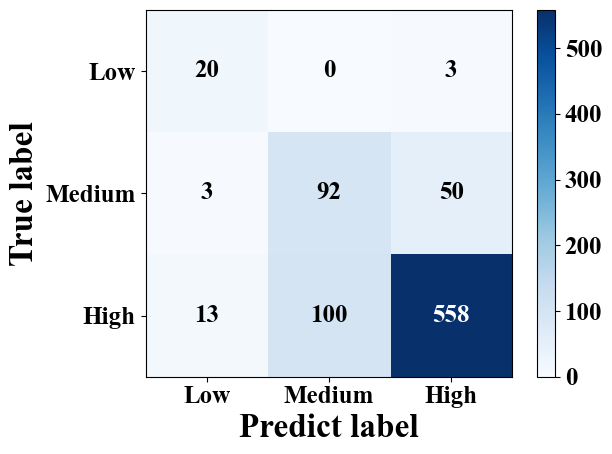

-----------------------------------------------------------------
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Best score: 0.9725791937052026
算法 RF 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 RF 在测试集中的表现如下 Accuracy: 0.867 macro-Precision: 0.768 macro-Recall: 0.755 macro-F1: 0.745 macro-AUC: 0.941
模型的准确率为： 0.866507747318236
模型的评估报告：
               precision    recall  f1-score   support

           0       0.69      0.87      0.77        23
           1       0.72      0.43      0.54       145
           2       0.89      0.96      0.92       671

    accuracy                           0.87       839
   macro avg       0.77      0.75      0.75       839
weighted avg       0.86      0.87      0.85       839



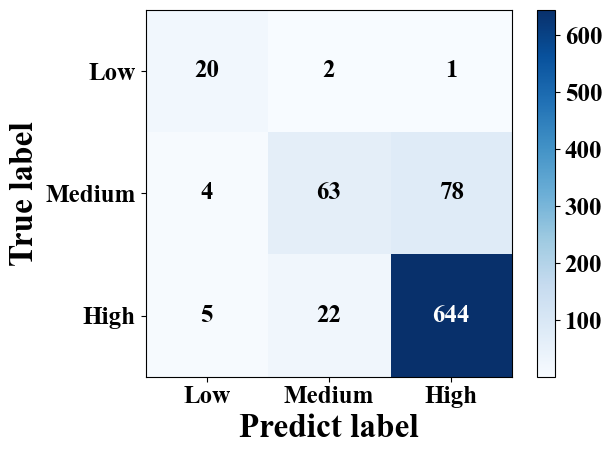

-----------------------------------------------------------------
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.1, 'n_estimators': 50}
Best score: 0.8633088384923238
算法 AdaBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 AdaBoost 在测试集中的表现如下 Accuracy: 0.732 macro-Precision: 0.504 macro-Recall: 0.624 macro-F1: 0.537 macro-AUC: 0.718
模型的准确率为： 0.7318235995232419
模型的评估报告：
               precision    recall  f1-score   support

           0       0.25      0.61      0.36        23
           1       0.38      0.47      0.42       145
           2       0.88      0.79      0.83       671

    accuracy                           0.73       839
   macro avg       0.50      0.62      0.54       839
weighted avg       0.78      0.73      0.75       839



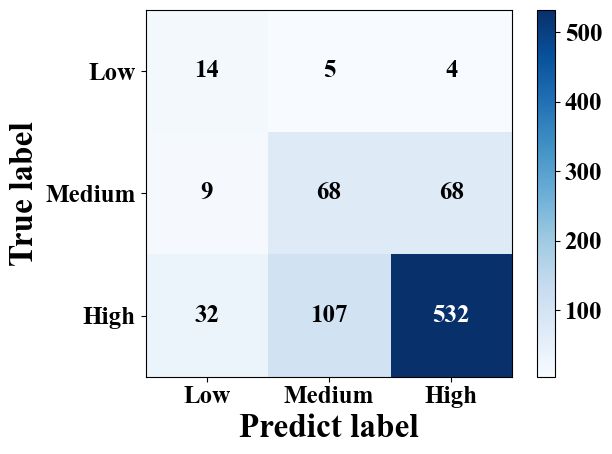

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'learning_rate': 0.5, 'max_depth': 5, 'min_samples_split': 4, 'n_estimators': 200}
Best score: 0.9676894204897462
算法 GBDT 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 GBDT 在测试集中的表现如下 Accuracy: 0.855 macro-Precision: 0.713 macro-Recall: 0.774 macro-F1: 0.729 macro-AUC: 0.929
模型的准确率为： 0.8545887961859356
模型的评估报告：
               precision    recall  f1-score   support

           0       0.60      0.91      0.72        23
           1       0.64      0.48      0.55       145
           2       0.90      0.93      0.92       671

    accuracy                           0.85       839
   macro avg       0.71      0.77      0.73       839
weighted avg       0.85      0.85      0.85       839



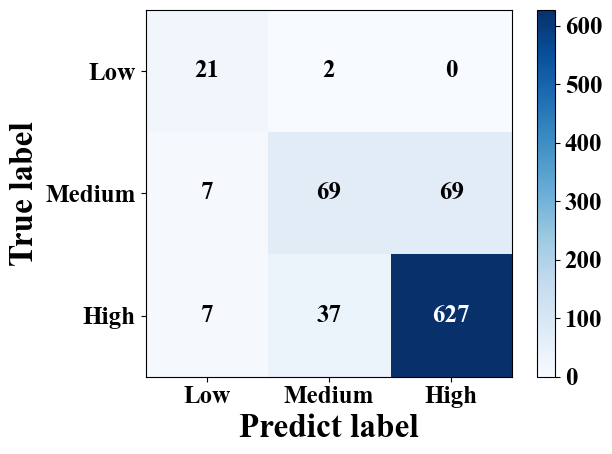

-----------------------------------------------------------------
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 200}
Best score: 0.9700280371718634
算法 XGBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 XGBoost 在测试集中的表现如下 Accuracy: 0.861 macro-Precision: 0.726 macro-Recall: 0.762 macro-F1: 0.736 macro-AUC: 0.929
模型的准确率为： 0.8605482717520858
模型的评估报告：
               precision    recall  f1-score   support

           0       0.61      0.83      0.70        23
           1       0.66      0.52      0.58       145
           2       0.90      0.93      0.92       671

    accuracy                           0.86       839
   macro avg       0.73      0.76      0.74       839
weighted avg       0.85      0.86      0.86       839



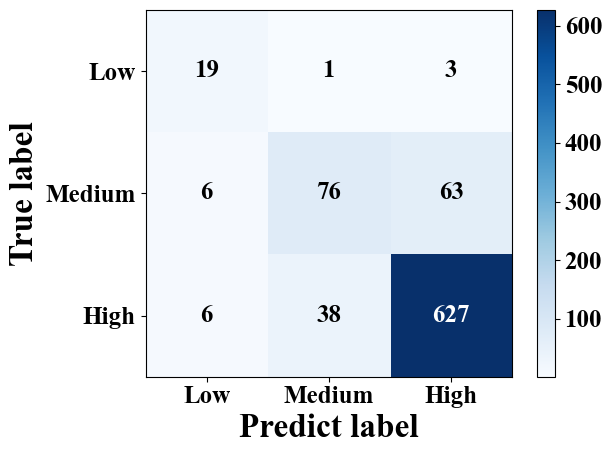

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'boosting_type': 'gbdt', 'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 127}
Best score: 0.9768299907296448
算法 LightGBM 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 LightGBM 在测试集中的表现如下 Accuracy: 0.869 macro-Precision: 0.747 macro-Recall: 0.735 macro-F1: 0.725 macro-AUC: 0.937
模型的准确率为： 0.8688915375446961
模型的评估报告：
               precision    recall  f1-score   support

           0       0.60      0.78      0.68        23
           1       0.74      0.46      0.57       145
           2       0.90      0.96      0.93       671

    accuracy                           0.87       839
   macro avg       0.75      0.73      0.73       839
weighted avg       0.86      0.87      0.86       839



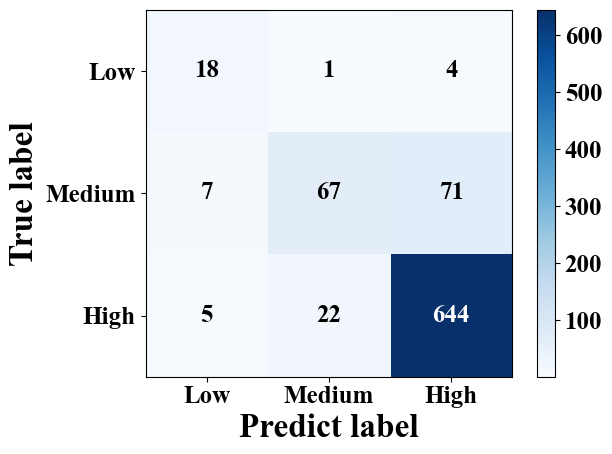

-----------------------------------------------------------------
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters: {'activation': 'relu', 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'solver': 'adam'}
Best score: 0.9593983313360617
算法 MLP 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 MLP 在测试集中的表现如下 Accuracy: 0.833 macro-Precision: 0.691 macro-Recall: 0.776 macro-F1: 0.721 macro-AUC: 0.908
模型的准确率为： 0.833134684147795
模型的评估报告：
               precision    recall  f1-score   support

           0       0.63      0.96      0.76        23
           1       0.55      0.46      0.50       145
           2       0.89      0.91      0.90       671

    accuracy                           0.83       839
   macro avg       0.69      0.78      0.72       839
weighted avg       0.83      0.83      0.83       839



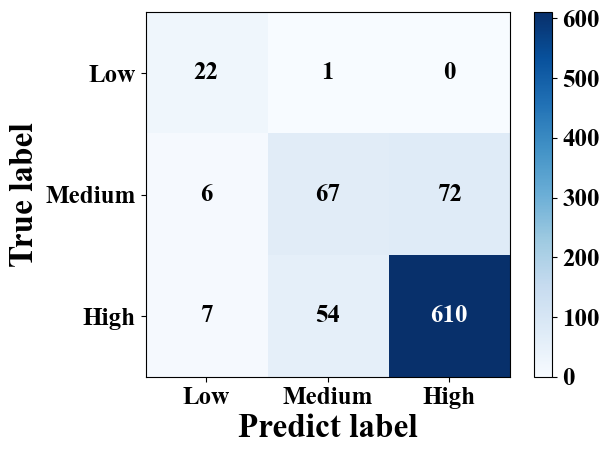

-----------------------------------------------------------------


In [62]:
# 顶区
EEGDingQuResultInfo = stepIntegration(EEGDingQuFeatures, TrustLabel, 'EEG_DingQu')

In [63]:
EEGDingQuResultInfo.to_csv('D:/Win_Step/Result/LRC0.1/EEG_DingQu.csv', index=False, mode='w')

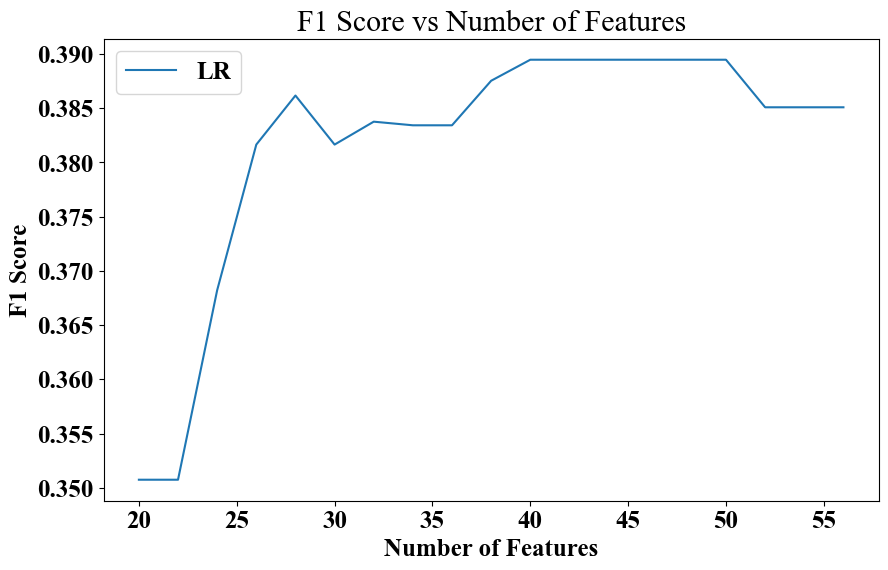

Best Algorithm: LR
Best F1 Score: 0.38947798344712786
Index(['Fp1_Mean', 'Fpz_Mean', 'Fp2_Mean', 'F7_Mean', 'F3_Mean', 'Fz_Mean',
       'F4_Mean', 'F8_Mean', 'FC5_Mean', 'FC1_Mean', 'FC2_Mean', 'FC6_Mean',
       'T7_Mean', 'C3_Mean', 'Cz_Mean', 'C4_Mean', 'T8_Mean', 'CP5_Mean',
       'CP1_Mean', 'CP2_Mean', 'CP6_Mean', 'P7_Mean', 'P3_Mean', 'Pz_Mean',
       'P4_Mean', 'P8_Mean', 'POz_Mean', 'O1_Mean', 'Oz_Mean', 'O2_Mean',
       'Fp1_Std', 'Fpz_Std', 'Fp2_Std', 'F7_Std', 'F3_Std', 'Fz_Std', 'F4_Std',
       'F8_Std', 'FC5_Std', 'FC1_Std'],
      dtype='object')
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 5}
Best score: 0.7374551744409523
算法 DT 在训练集中的表现如下 Accuracy: 0.769 macro-Precision: 0.823 macro-Recall: 0.769 macro-F1: 0.763 macro-AUC: 0.905
算法 DT 在测试集中的表现如下 Accuracy: 0.487 macro-Precision: 0.458 macro-Recall: 0.575 macro-F1: 0.411 macro-AUC: 0.722
模型的准确率为： 0.48748510131108463
模型的评估报

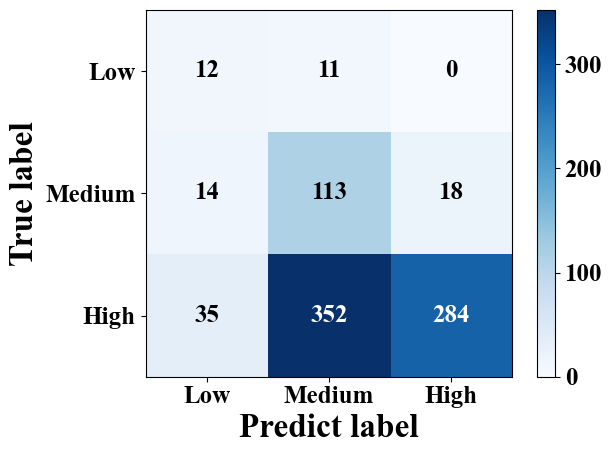

-----------------------------------------------------------------
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Best parameters: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Best score: 0.8992348565356005
算法 KNN 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 KNN 在测试集中的表现如下 Accuracy: 0.71 macro-Precision: 0.533 macro-Recall: 0.721 macro-F1: 0.573 macro-AUC: 0.853
模型的准确率为： 0.7103694874851013
模型的评估报告：
               precision    recall  f1-score   support

           0       0.28      0.74      0.41        23
           1       0.39      0.72      0.51       145
           2       0.92      0.71      0.80       671

    accuracy                           0.71       839
   macro avg       0.53      0.72      0.57       839
weighted avg       0.81      0.71      0.74       839



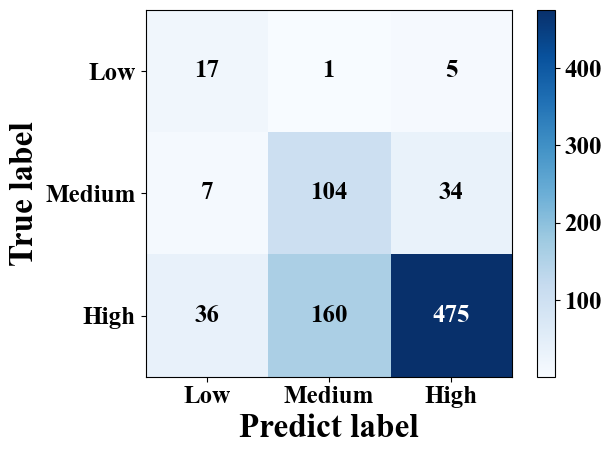

-----------------------------------------------------------------
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best parameters: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Best score: 0.8873333031858367
算法 SVM 在训练集中的表现如下 Accuracy: 0.923 macro-Precision: 0.927 macro-Recall: 0.923 macro-F1: 0.922 macro-AUC: 0.984
算法 SVM 在测试集中的表现如下 Accuracy: 0.726 macro-Precision: 0.533 macro-Recall: 0.694 macro-F1: 0.572 macro-AUC: 0.858
模型的准确率为： 0.7258641239570918
模型的评估报告：
               precision    recall  f1-score   support

           0       0.29      0.70      0.41        23
           1       0.39      0.64      0.48       145
           2       0.92      0.75      0.82       671

    accuracy                           0.73       839
   macro avg       0.53      0.69      0.57       839
weighted avg       0.81      0.73      0.75       839



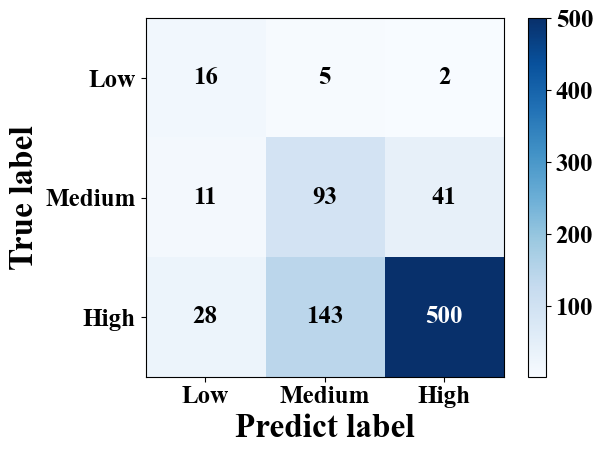

-----------------------------------------------------------------
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Best parameters: {'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}
Best score: 0.9547199674407036
算法 RF 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 RF 在测试集中的表现如下 Accuracy: 0.815 macro-Precision: 0.647 macro-Recall: 0.653 macro-F1: 0.648 macro-AUC: 0.892
模型的准确率为： 0.8152562574493445
模型的评估报告：
               precision    recall  f1-score   support

           0       0.54      0.61      0.57        23
           1       0.52      0.45      0.48       145
           2       0.88      0.90      0.89       671

    accuracy                           0.82       839
   macro avg       0.65      0.65      0.65       839
weighted avg       0.81      0.82      0.81       839



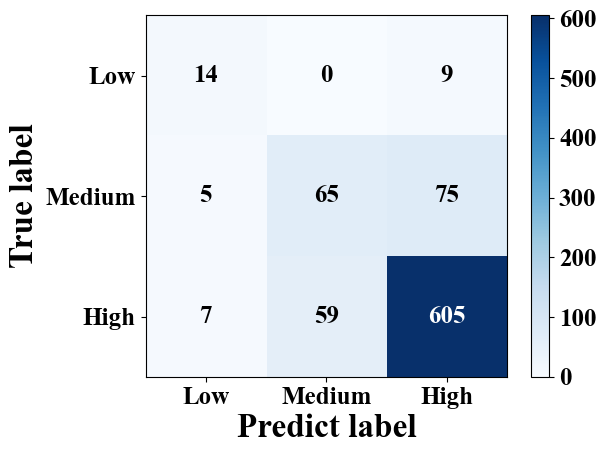

-----------------------------------------------------------------
Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters: {'algorithm': 'SAMME', 'learning_rate': 0.1, 'n_estimators': 50}
Best score: 0.8492787211431929
算法 AdaBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 AdaBoost 在测试集中的表现如下 Accuracy: 0.703 macro-Precision: 0.49 macro-Recall: 0.599 macro-F1: 0.521 macro-AUC: 0.7
模型的准确率为： 0.7032181168057211
模型的评估报告：
               precision    recall  f1-score   support

           0       0.27      0.57      0.36        23
           1       0.33      0.48      0.39       145
           2       0.88      0.76      0.81       671

    accuracy                           0.70       839
   macro avg       0.49      0.60      0.52       839
weighted avg       0.76      0.70      0.73       839



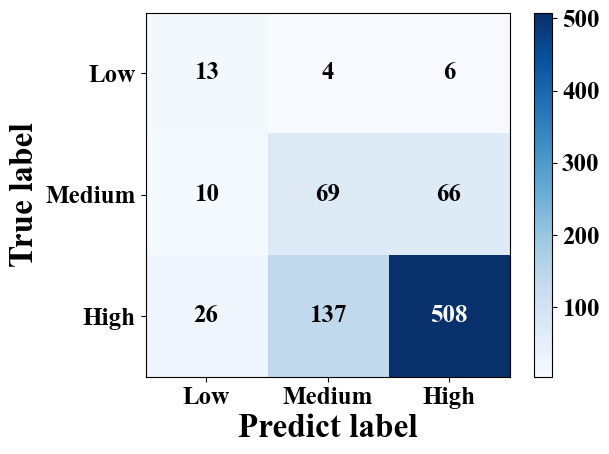

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'learning_rate': 0.5, 'max_depth': 5, 'min_samples_split': 8, 'n_estimators': 200}
Best score: 0.9500461256698397
算法 GBDT 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 GBDT 在测试集中的表现如下 Accuracy: 0.824 macro-Precision: 0.67 macro-Recall: 0.671 macro-F1: 0.67 macro-AUC: 0.877
模型的准确率为： 0.8235995232419547
模型的评估报告：
               precision    recall  f1-score   support

           0       0.58      0.61      0.60        23
           1       0.54      0.50      0.52       145
           2       0.89      0.90      0.89       671

    accuracy                           0.82       839
   macro avg       0.67      0.67      0.67       839
weighted avg       0.82      0.82      0.82       839



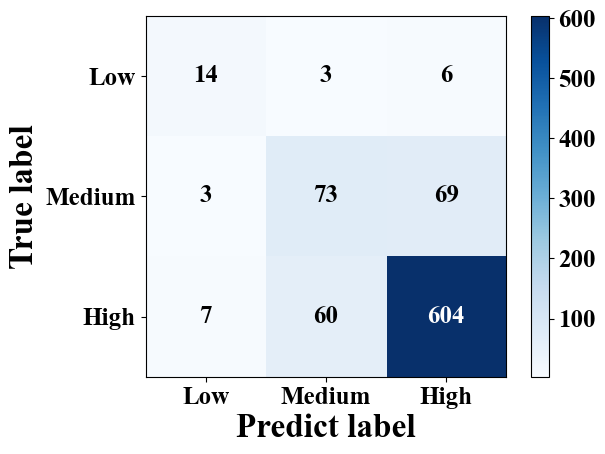

-----------------------------------------------------------------
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best parameters: {'learning_rate': 0.2, 'max_depth': 6, 'n_estimators': 200}
Best score: 0.9515330002034956
算法 XGBoost 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 XGBoost 在测试集中的表现如下 Accuracy: 0.822 macro-Precision: 0.643 macro-Recall: 0.665 macro-F1: 0.652 macro-AUC: 0.878
模型的准确率为： 0.8224076281287247
模型的评估报告：
               precision    recall  f1-score   support

           0       0.50      0.61      0.55        23
           1       0.54      0.48      0.51       145
           2       0.89      0.90      0.90       671

    accuracy                           0.82       839
   macro avg       0.64      0.66      0.65       839
weighted avg       0.82      0.82      0.82       839



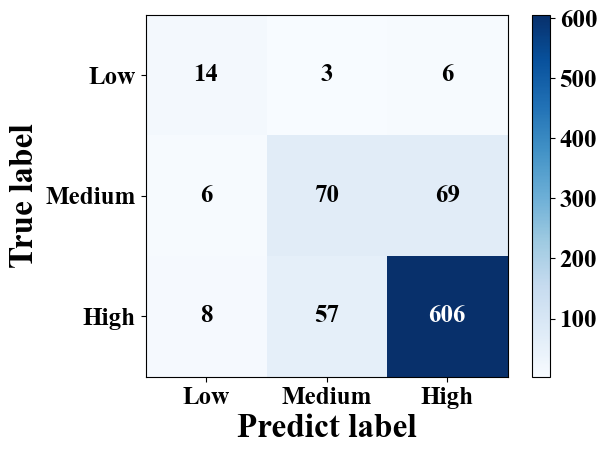

-----------------------------------------------------------------
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'boosting_type': 'goss', 'learning_rate': 0.1, 'n_estimators': 200, 'num_leaves': 127}
Best score: 0.9610977457209398
算法 LightGBM 在训练集中的表现如下 Accuracy: 1.0 macro-Precision: 1.0 macro-Recall: 1.0 macro-F1: 1.0 macro-AUC: 1.0
算法 LightGBM 在测试集中的表现如下 Accuracy: 0.838 macro-Precision: 0.696 macro-Recall: 0.673 macro-F1: 0.683 macro-AUC: 0.888
模型的准确率为： 0.8379022646007152
模型的评估报告：
               precision    recall  f1-score   support

           0       0.61      0.61      0.61        23
           1       0.59      0.49      0.54       145
           2       0.89      0.92      0.90       671

    accuracy                           0.84       839
   macro avg       0.70      0.67      0.68       839
weighted avg       0.83      0.84      0.83       839



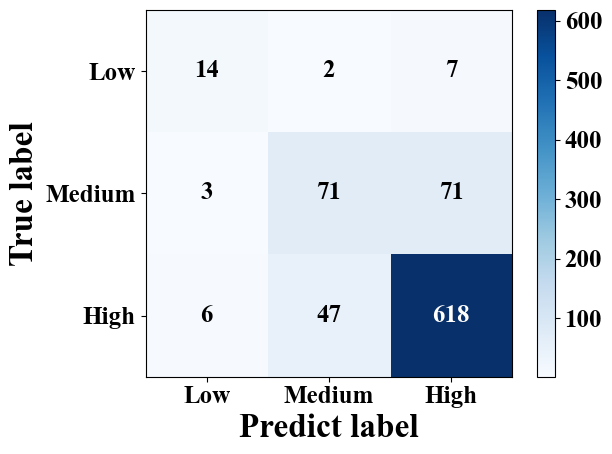

-----------------------------------------------------------------
Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best parameters: {'activation': 'relu', 'hidden_layer_sizes': (50, 50), 'learning_rate': 'constant', 'solver': 'adam'}
Best score: 0.9443046103059217
算法 MLP 在训练集中的表现如下 Accuracy: 0.997 macro-Precision: 0.997 macro-Recall: 0.997 macro-F1: 0.997 macro-AUC: 1.0
算法 MLP 在测试集中的表现如下 Accuracy: 0.806 macro-Precision: 0.612 macro-Recall: 0.704 macro-F1: 0.647 macro-AUC: 0.873
模型的准确率为： 0.8057210965435042
模型的评估报告：
               precision    recall  f1-score   support

           0       0.43      0.70      0.53        23
           1       0.50      0.55      0.52       145
           2       0.90      0.86      0.88       671

    accuracy                           0.81       839
   macro avg       0.61      0.70      0.65       839
weighted avg       0.82      0.81      0.81       839



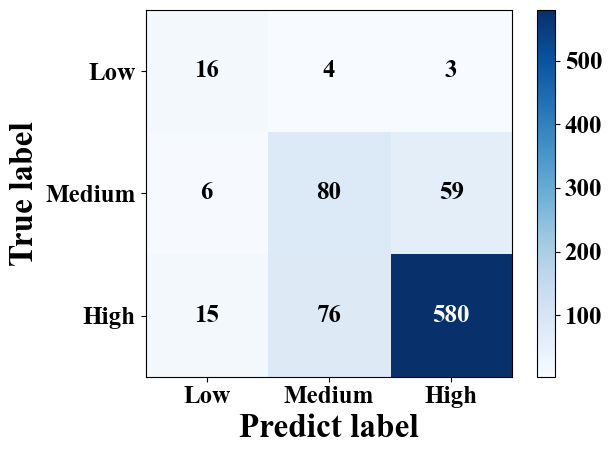

-----------------------------------------------------------------


In [64]:
# 枕区
EEGZhenQuResultInfo = stepIntegration(EEGZhenQuFeatures, TrustLabel, 'EEG_ZhenQu')

In [65]:
EEGZhenQuResultInfo.to_csv('D:/Win_Step/Result/LRC0.1/EEG_ZhenQu.csv', index=False, mode='w')

# 结果汇总导出

In [66]:
def resultTransfer2(path, dataType):
    # 转换为DataFrame操作
    data = pd.read_csv(path)
    
    # 截取 Accuracy 
    subData1 = data.loc[:,['Algorithm', 'ACC']]
    subData1['ValueType'] = 'Accuracy'
    subData1.rename(columns = {"ACC": "Value"}, inplace=True)
    
    # 截取 Precison 
    subData2 = data.loc[:,['Algorithm', 'Precison']]
    subData2['ValueType'] = 'Precision'
    subData2.rename(columns = {"Precison": "Value"}, inplace=True)
    
    # 截取 Recall 
    subData3 = data.loc[:,['Algorithm', 'Recall']]
    subData3['ValueType'] = 'Recall'
    subData3.rename(columns = {"Recall": "Value"}, inplace=True)
    
    # 截取 F1-score 
    subData4 = data.loc[:,['Algorithm', 'F1-score']]
    subData4['ValueType'] = 'F1-score'
    subData4.rename(columns = {"F1-score": "Value"}, inplace=True)
    
    # 截取 AUC
    subData5 = data.loc[:,['Algorithm', 'AUC']]
    subData5['ValueType'] = 'AUC'
    subData5.rename(columns = {"AUC": "Value"}, inplace=True)
    
    # 拼凑两个子DF
    dataNew = pd.concat([subData1, subData2, subData3, subData4, subData5]).reset_index(drop=True)
    
    # 标明这是哪种数据
    dataNew['DataType'] = dataType
    
    return dataNew

# SHAP图绘制

In [67]:
import shap

In [68]:
def datasetSplit(features, label):
    # 调用训练集测试集划分函数
    xTrain, xTest, yTrain, yTest = dataSplitStandard(features, label, 42)
    
    if xTrain.shape[1] > 10:
        # 调用特征选择函数
        xTrainRFE, xTestRFE = featureSelect111(xTrain, xTest, yTrain, yTest, 420,2, 42, columnNames)
    else :
        xTrainRFE, xTestRFE = xTrain, xTest
        
    # 调用样本均衡函数
    xTrainResample, yTrainResample = resampleFunction(xTrainRFE, yTrain, 42)
    # 打印特征信息
    return xTrainResample, yTrainResample, xTestRFE, yTest

In [69]:
def shapFig(model, features, label,dataType):
    xTrain, yTrain, xTest, yTest = datasetSplit(features, label)
    
    model.fit(xTrain, yTrain)
    
    explainer = shap.TreeExplainer(model)
    
    shap_values = explainer.shap_values(xTest)
    summary = shap.summary_plot(shap_values, xTest, class_names=['Low','Medium','High'],class_inds=[0,1,2],plot_type="bar",max_display=10,show=False)
    # 设置dpi并保存图片到本地
    plt.savefig(f'D:/Win_Step/Win16_Step8/Picture/LRC0.1/{dataType} SHAP.jpg', dpi=300)
    
    plt.show()

# 模型特征重要性绘制

In [70]:
EEGModel = RandomForestClassifier(n_estimators=200,max_depth=None,max_features='auto',min_samples_leaf=1\
                               ,min_samples_split=2,random_state=42)

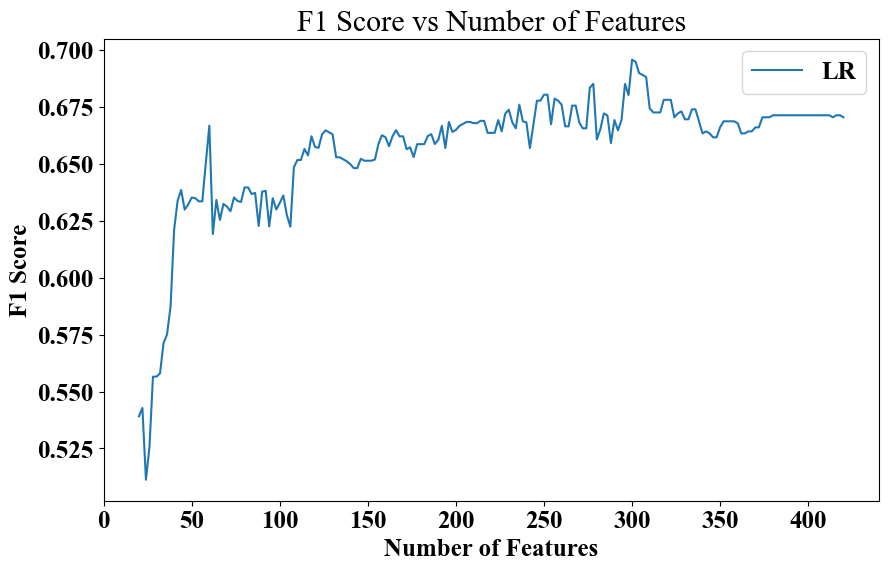

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


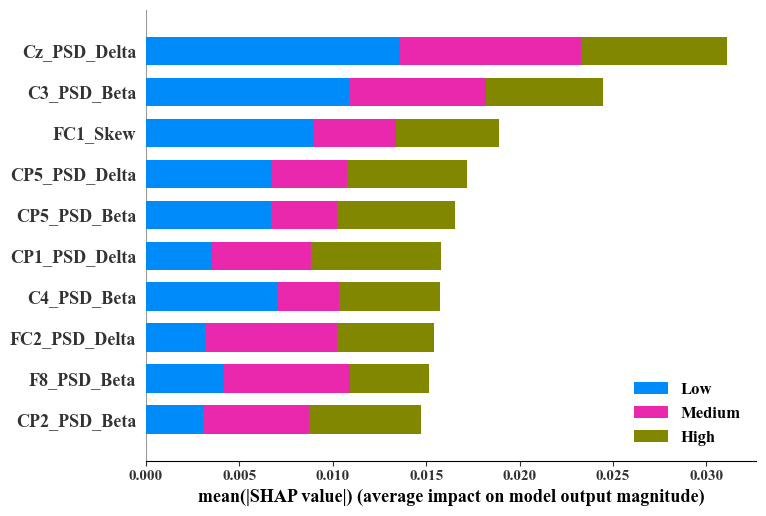

In [71]:
shapFig(EEGModel, chEEGFeatures, TrustLabel, 'EEG')

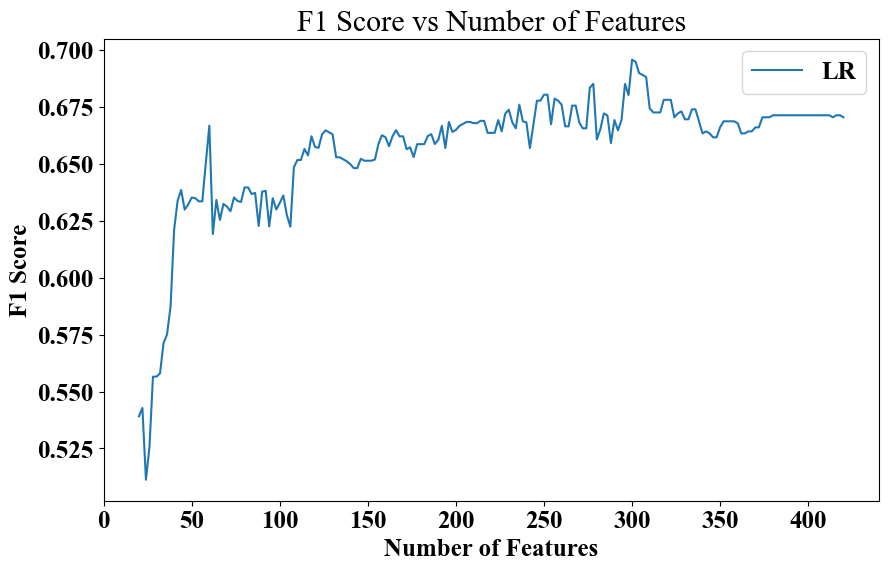

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


In [72]:
xTrainEEG, yTrainEEG, xTestEEG, yTestEEG = datasetSplit(chEEGFeatures, TrustLabel)

In [73]:
EEGModel.fit(xTrainEEG, yTrainEEG)

RandomForestClassifier(max_features='auto', n_estimators=200, random_state=42)

In [74]:
def SHAP_summary111(model, features, label, dataType):
    xTrain, yTrain, xTest, yTest = datasetSplit(features, label)

    model.fit(xTrain, yTrain)

    explainer = shap.TreeExplainer(model)

    shap_values = explainer.shap_values(xTest)

    # 绘制 SHAP 摘要图
    for i in range(0,3):
    # 创建图形并设置 DPI
        plt.figure(dpi=600)
        shap.summary_plot(shap_values[i], xTest,max_display=10)
        i+=1
    # 显示图形
    plt.show()

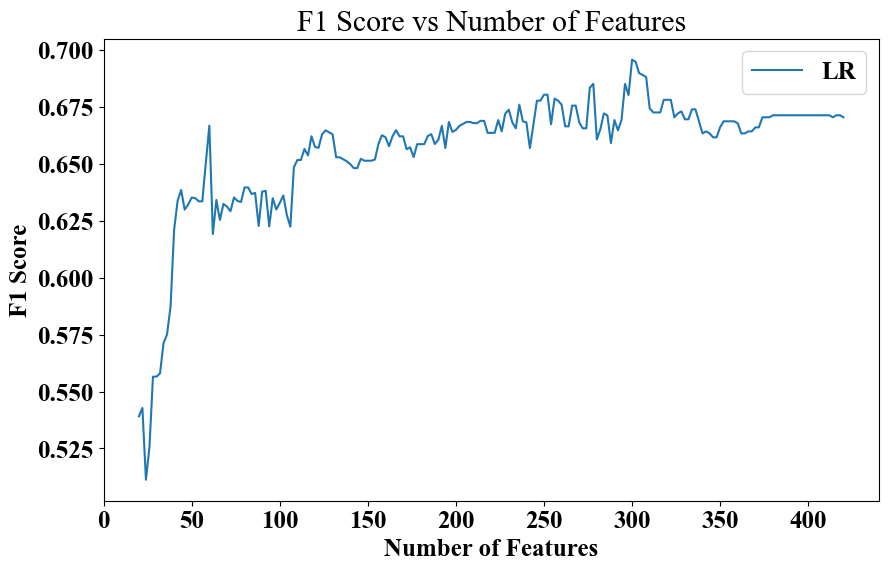

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


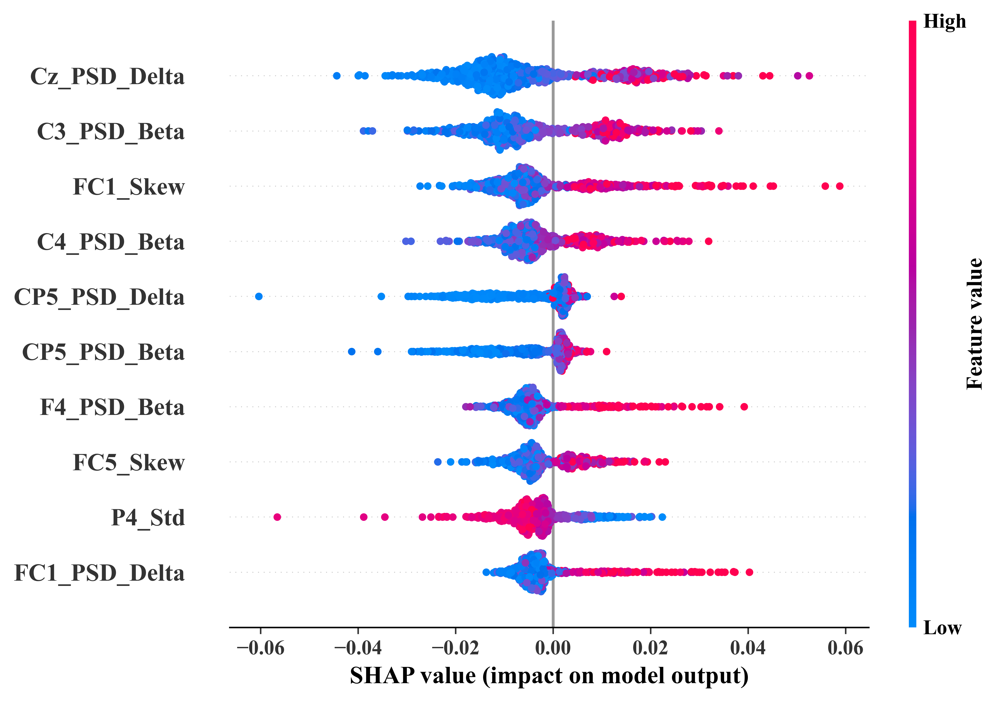

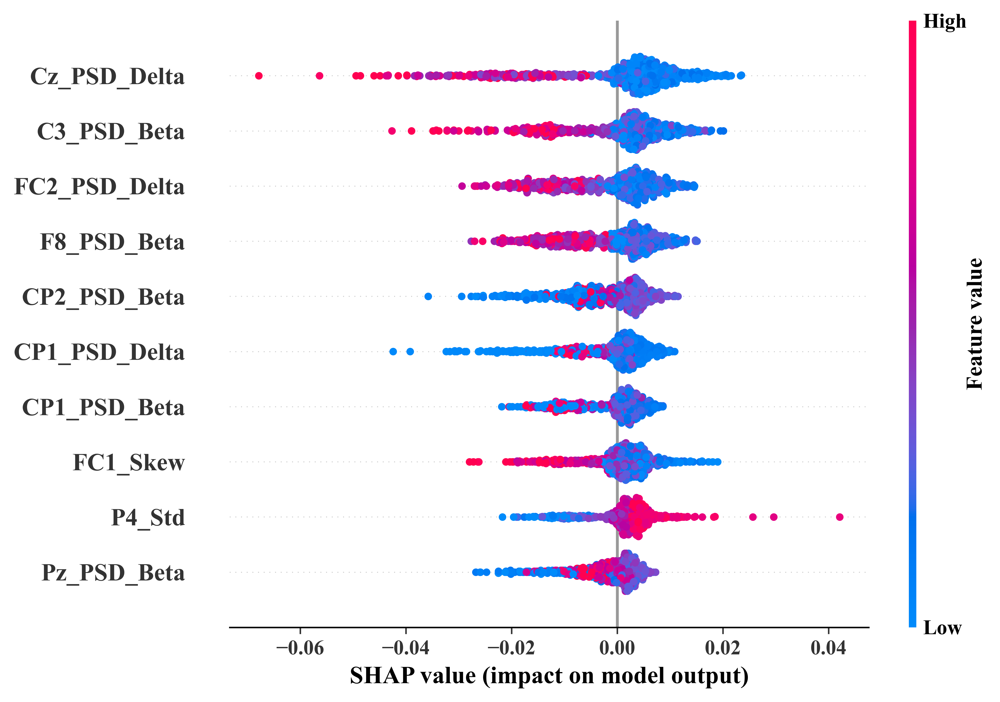

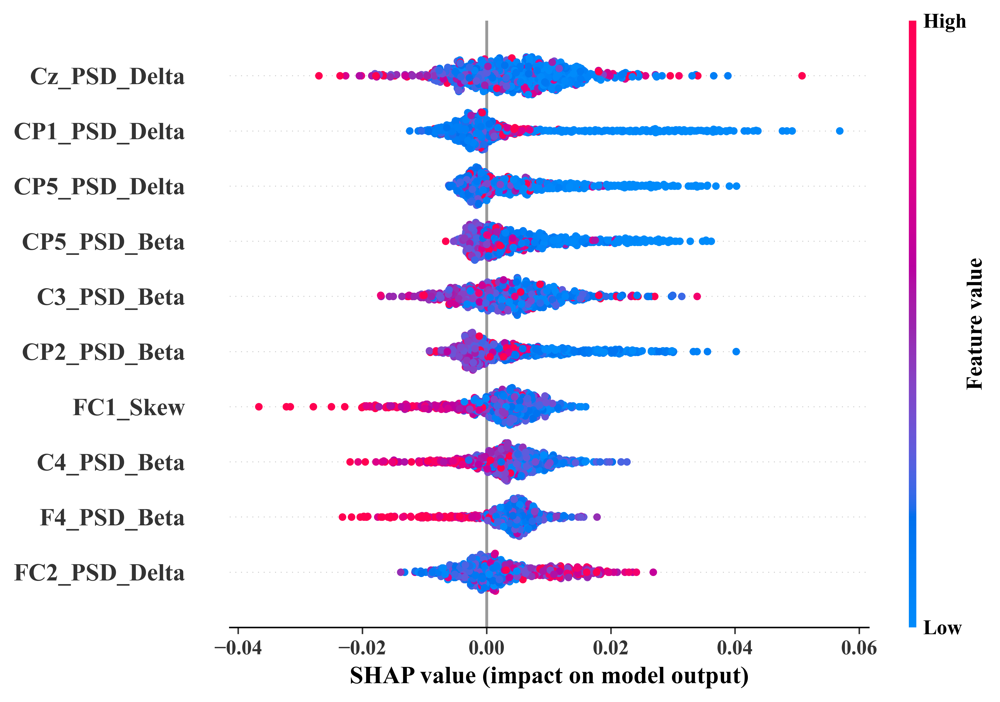

In [75]:
SHAP_summary111(EEGModel, chEEGFeatures, TrustLabel, 'EEG')

In [76]:
import shap

def shapFig111(model, features, label, dataType):
    xTrain, yTrain, xTest, yTest = datasetSplit(features, label)

    model.fit(xTrain, yTrain)

    explainer = shap.TreeExplainer(model)

    shap_values = explainer.shap_values(xTest)

    # 绘制 SHAP 摘要图
    shap.summary_plot(shap_values, xTest,max_display=10)

    plt.show()


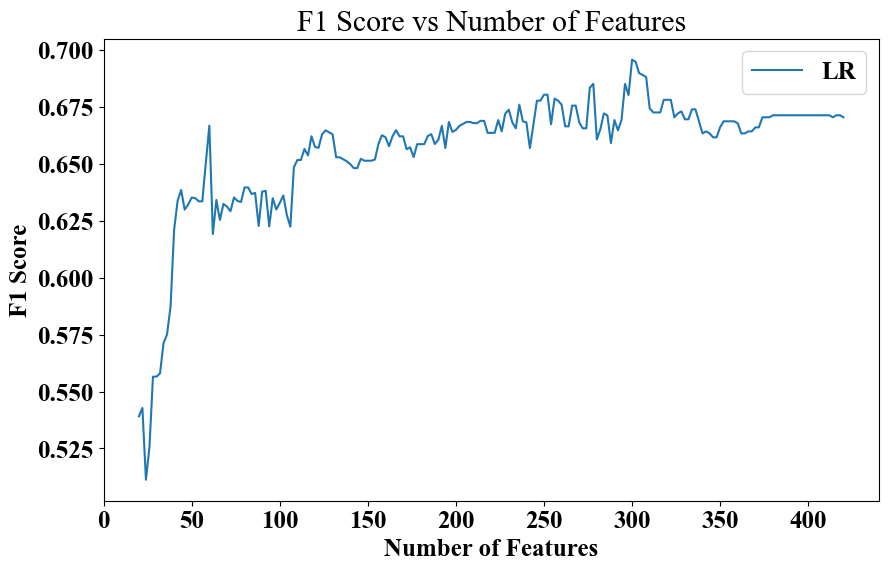

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


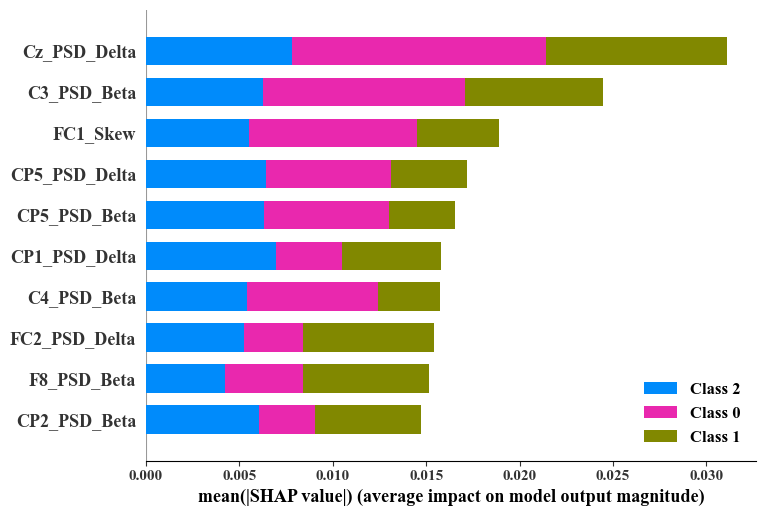

In [77]:
shapFig111(EEGModel, chEEGFeatures, TrustLabel, 'EEG')

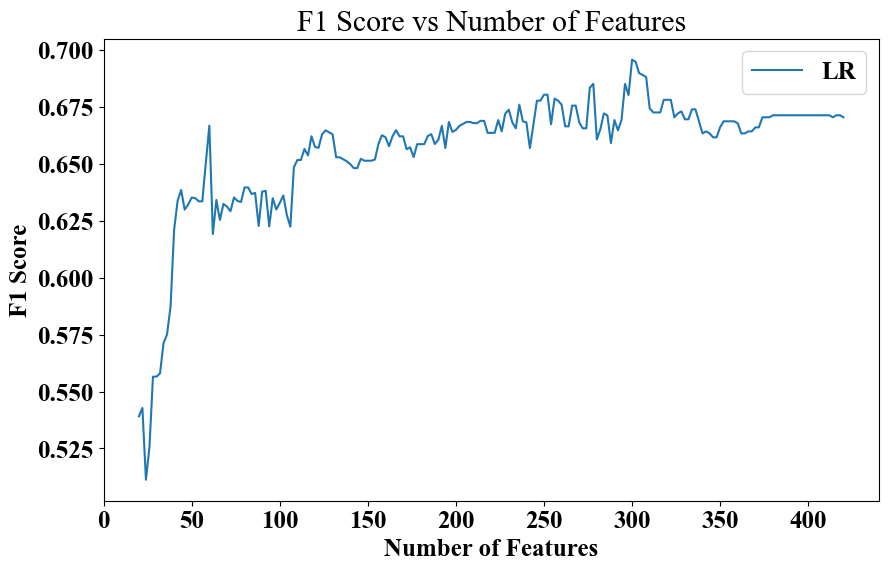

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


In [78]:
xTrain, yTrain, xTest, yTest = datasetSplit(chEEGFeatures, TrustLabel)

In [79]:
EEGModel.fit(xTrain, yTrain)

RandomForestClassifier(max_features='auto', n_estimators=200, random_state=42)

In [80]:
explainer = shap.TreeExplainer(EEGModel)
shap_values = explainer.shap_values(xTest)  # 传入特征矩阵X，计算SHAP值

In [81]:
shap_values

[array([[-1.89354234e-04, -3.45053735e-04,  9.95066030e-06, ...,
         -6.76854080e-04, -2.65420047e-03, -1.92619926e-03],
        [-1.93599579e-04,  1.68326962e-03,  1.10246775e-07, ...,
          1.74872012e-03,  1.75320300e-03,  9.87727885e-04],
        [-3.31808728e-04, -1.77700911e-03, -1.13825545e-04, ...,
          1.15306411e-04, -7.02489210e-04, -1.07374285e-03],
        ...,
        [ 4.90853150e-06,  2.36187391e-04, -3.85895263e-05, ...,
         -1.45260361e-03, -1.87180305e-03, -2.01687608e-03],
        [ 2.65286741e-05,  4.26989233e-03,  2.58632610e-04, ...,
         -1.01343675e-03, -8.36097401e-03, -8.18359795e-03],
        [-1.29227736e-04, -7.73952102e-04,  3.57948513e-04, ...,
         -1.99726947e-03, -2.67824787e-04, -5.33906211e-03]]),
 array([[-2.12087793e-03, -2.34387959e-03,  1.92448915e-04, ...,
         -9.92914302e-04, -1.55386971e-03, -7.03569922e-04],
        [-1.09594646e-03, -5.06351166e-03, -2.86084306e-04, ...,
          1.81105397e-04,  1.55485632e

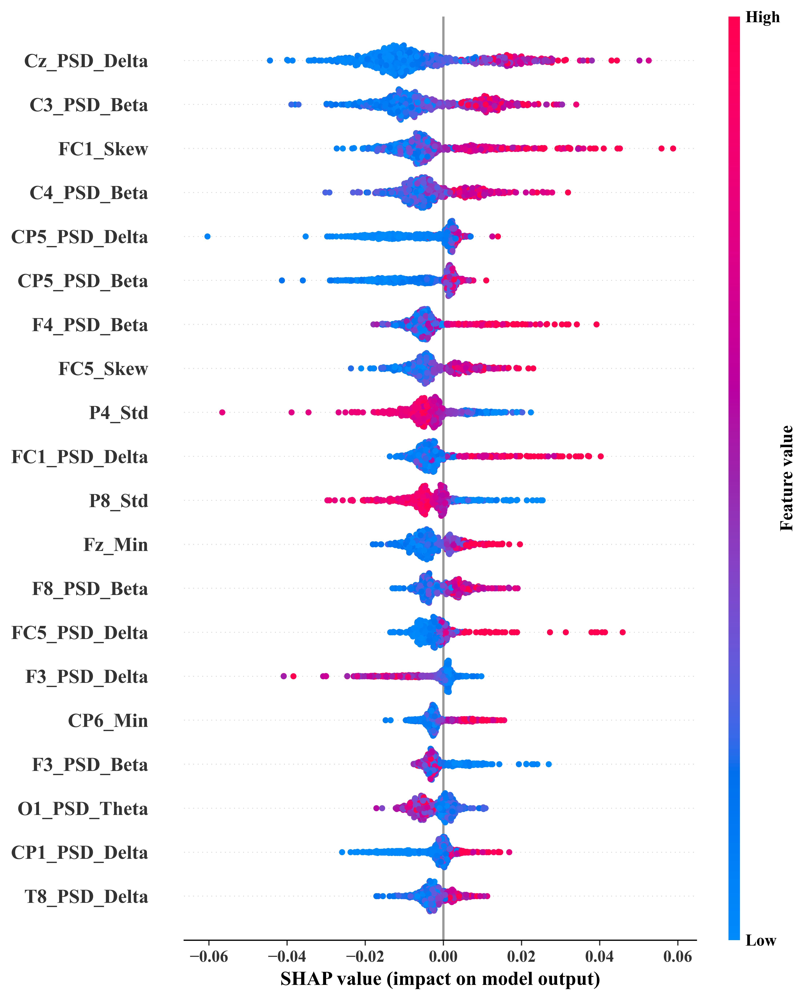

In [82]:
    # 创建图形并设置 DPI
    plt.figure(dpi=600)

    # 绘制 SHAP 摘要图
    shap.summary_plot(shap_values[0], xTest)

    # 显示图形
    plt.show()

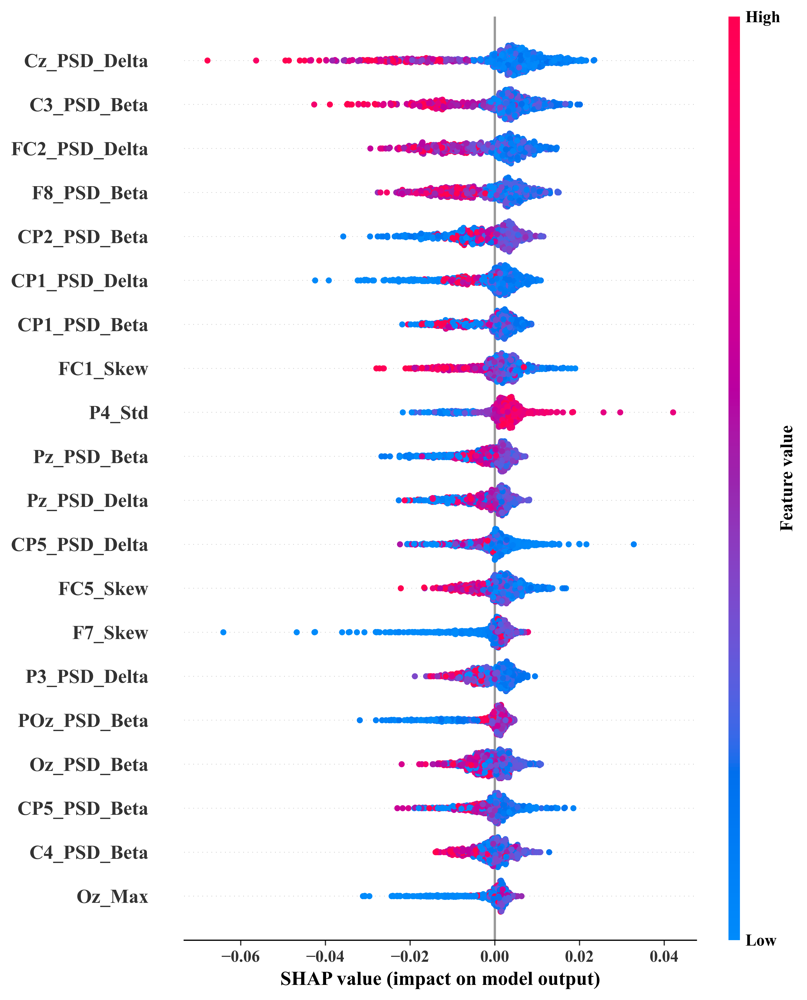

In [83]:
    # 创建图形并设置 DPI
    plt.figure(dpi=600)

    # 绘制 SHAP 摘要图
    shap.summary_plot(shap_values[1], xTest)

    # 显示图形
    plt.show()

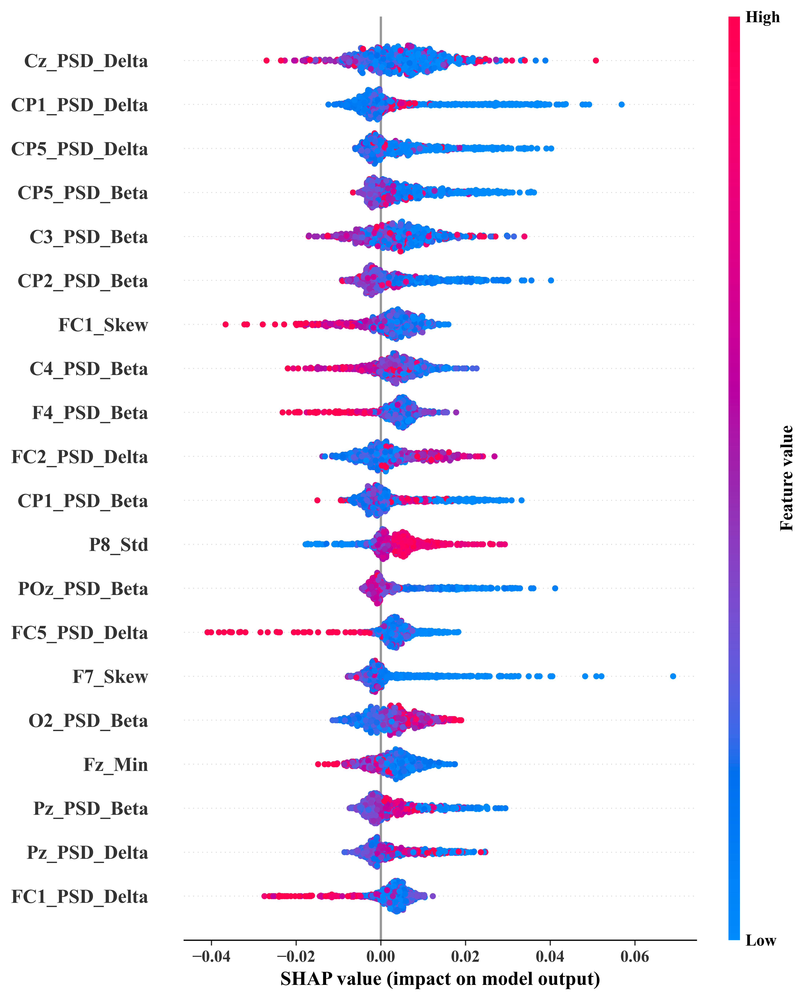

In [84]:
    # 创建图形并设置 DPI
    plt.figure(dpi=600)

    # 绘制 SHAP 摘要图
    shap.summary_plot(shap_values[2], xTest)

    # 显示图形
    plt.show()

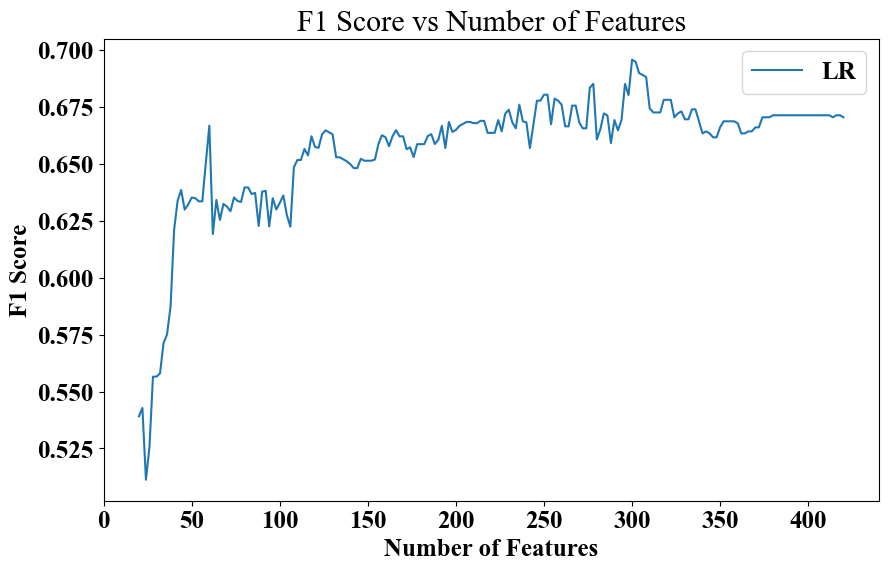

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


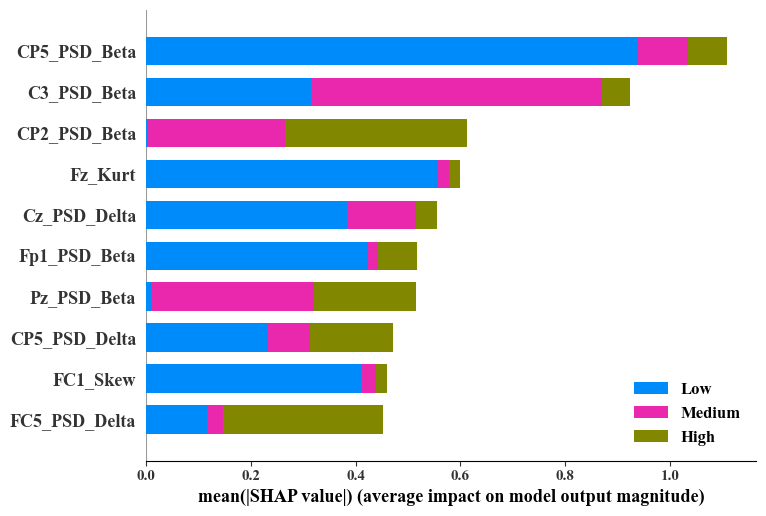

In [85]:
from lightgbm import LGBMClassifier

LGBMModel = LGBMClassifier(n_estimators=200, max_depth=-1, random_state=42)
shapFig(LGBMModel, chEEGFeatures, TrustLabel, 'EEG')

In [86]:
import shap

def shapFig111(model, features, label, dataType):
    xTrain, yTrain, xTest, yTest = datasetSplit(features, label)

    model.fit(xTrain, yTrain)

    explainer = shap.TreeExplainer(model)

    shap_values = explainer.shap_values(xTest)

    # 绘制 SHAP 摘要图
    shap.summary_plot(shap_values, xTest, class_names=['Low','Medium','High'],class_inds=[0,1,2],plot_type="bar",max_display=10,show=False)

    plt.show()

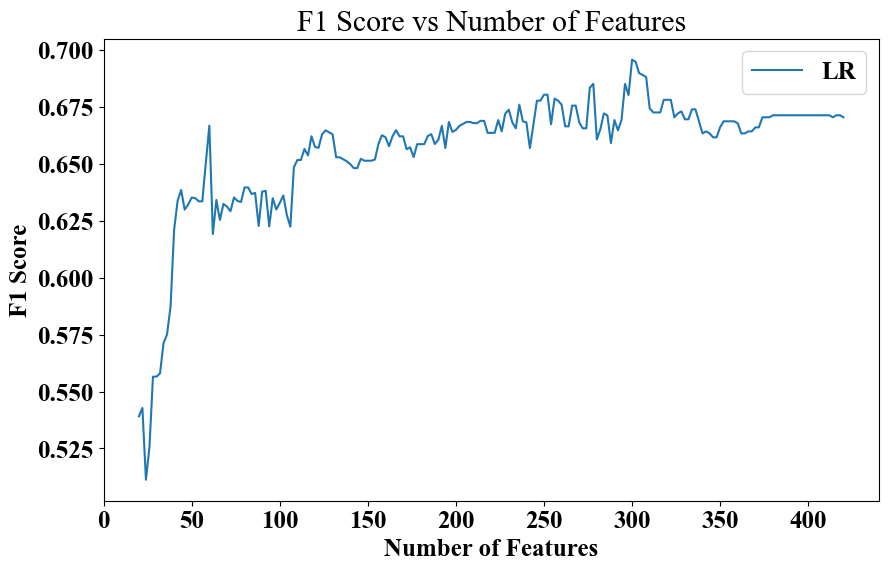

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


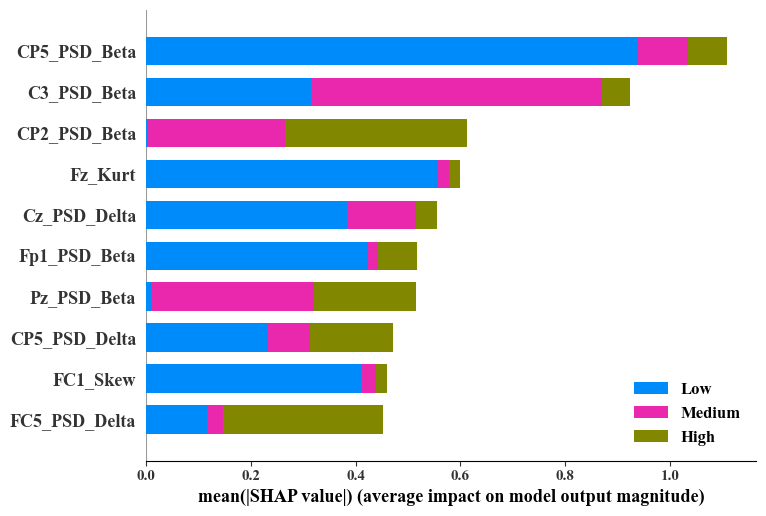

In [87]:
shapFig111(LGBMModel, chEEGFeatures, TrustLabel, 'EEG')

In [88]:
def SHAP_summary222(model, features, label, dataType):
    xTrain, yTrain, xTest, yTest = datasetSplit(features, label)

    model.fit(xTrain, yTrain)

    explainer = shap.TreeExplainer(model)

    shap_values = explainer.shap_values(xTest)

    # 绘制 SHAP 摘要图
    for i in range(0,3):
    # 创建图形并设置 DPI
        plt.figure(dpi=600)
        shap.summary_plot(shap_values[i], xTest,max_display=10)
        i+=1
    # 显示图形
    plt.show()

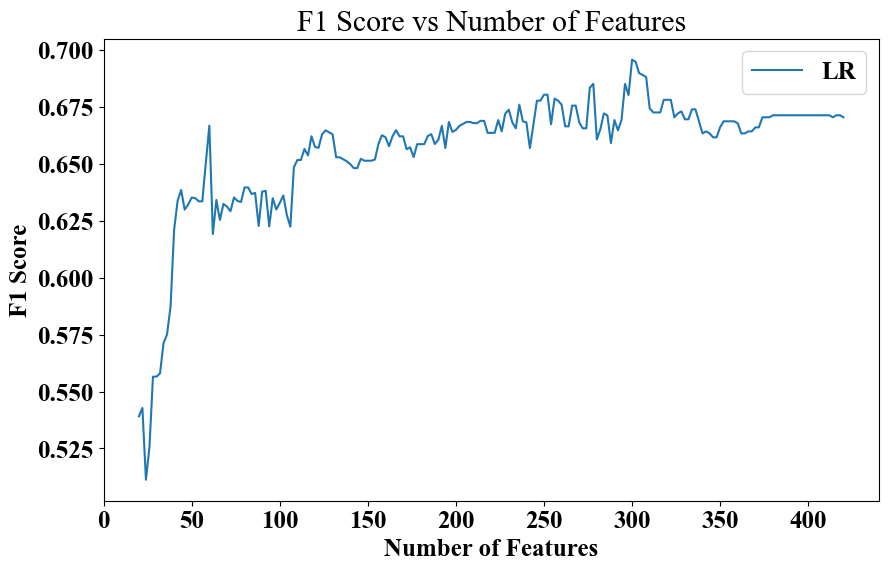

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


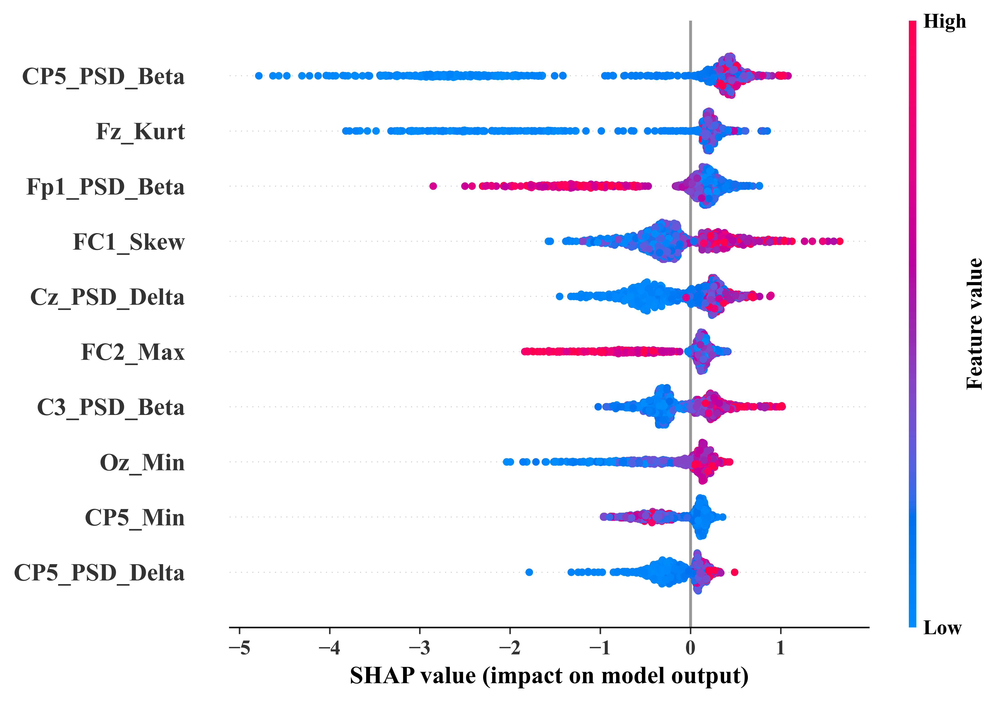

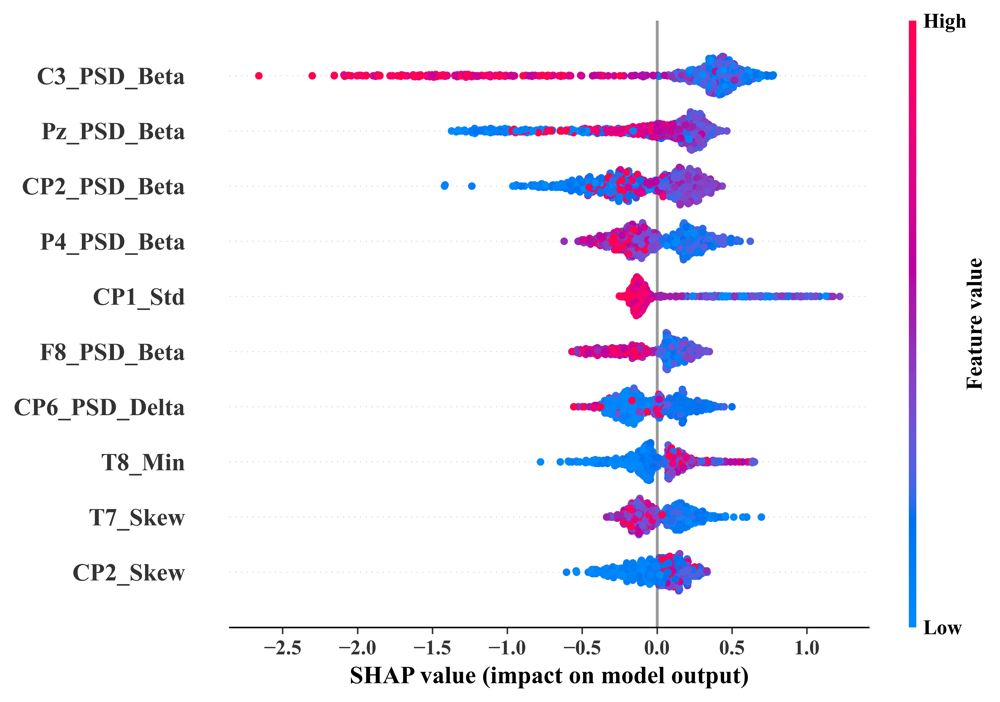

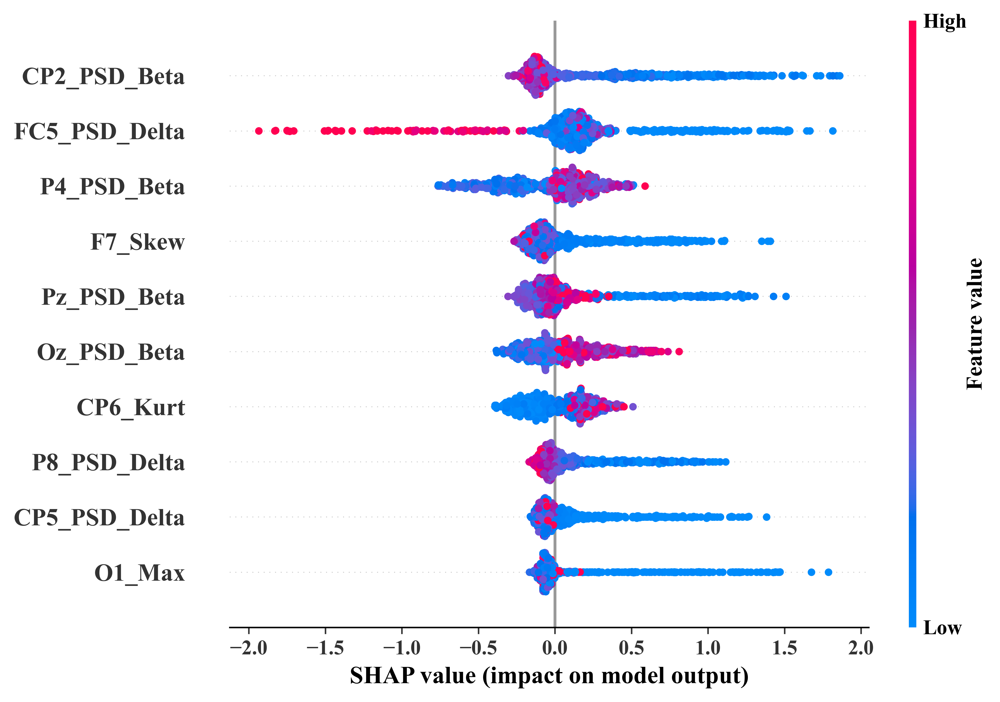

In [89]:
SHAP_summary222(LGBMModel, chEEGFeatures, TrustLabel, 'EEG')

In [90]:
def SHAP_summary333(model, features, label, dataType):
    xTrain, yTrain, xTest, yTest = datasetSplit(features, label)

    model.fit(xTrain, yTrain)

    explainer = shap.TreeExplainer(model)

    shap_values = explainer.shap_values(xTest)

    # 绘制 SHAP 摘要图
    for i in range(3):
        # 创建图形并设置 DPI
        plt.figure(dpi=600)
        # 设置横坐标范围
        plt.xlim(-2.0, 2.0)
        shap.summary_plot(shap_values[i], xTest,max_display=10)
        i+=1
    # 显示图形
    plt.show()

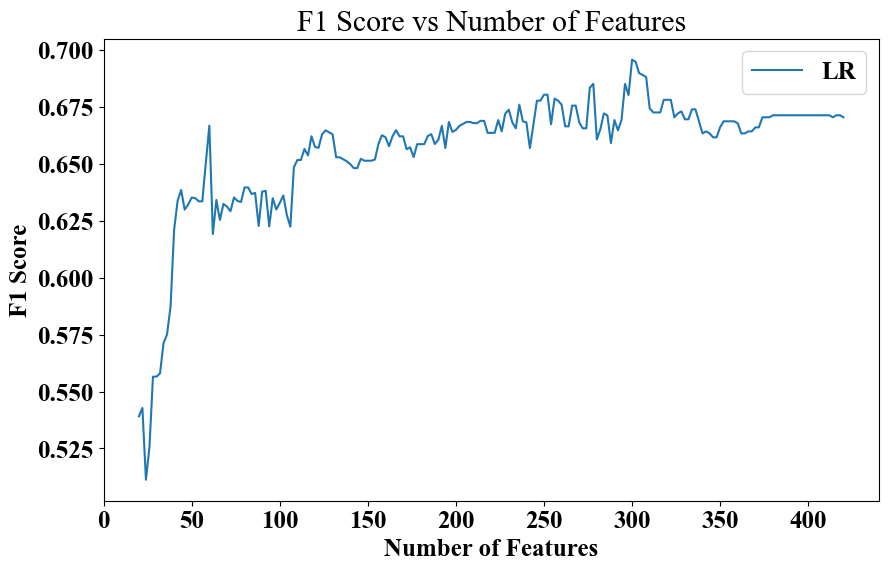

Best Algorithm: LR
Best F1 Score: 0.6956202077234587


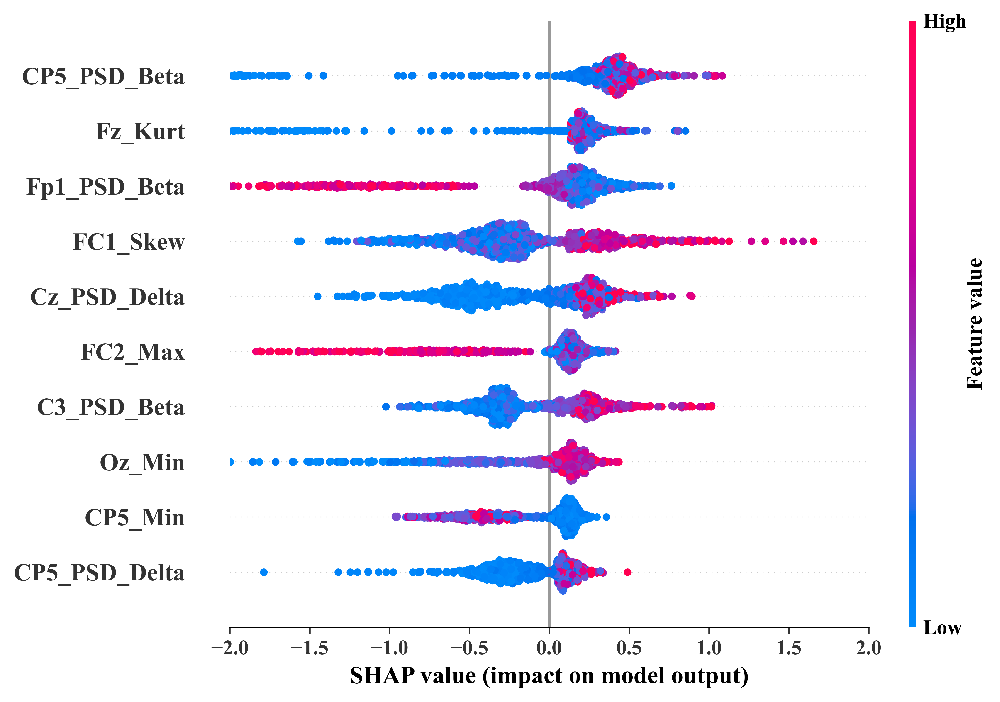

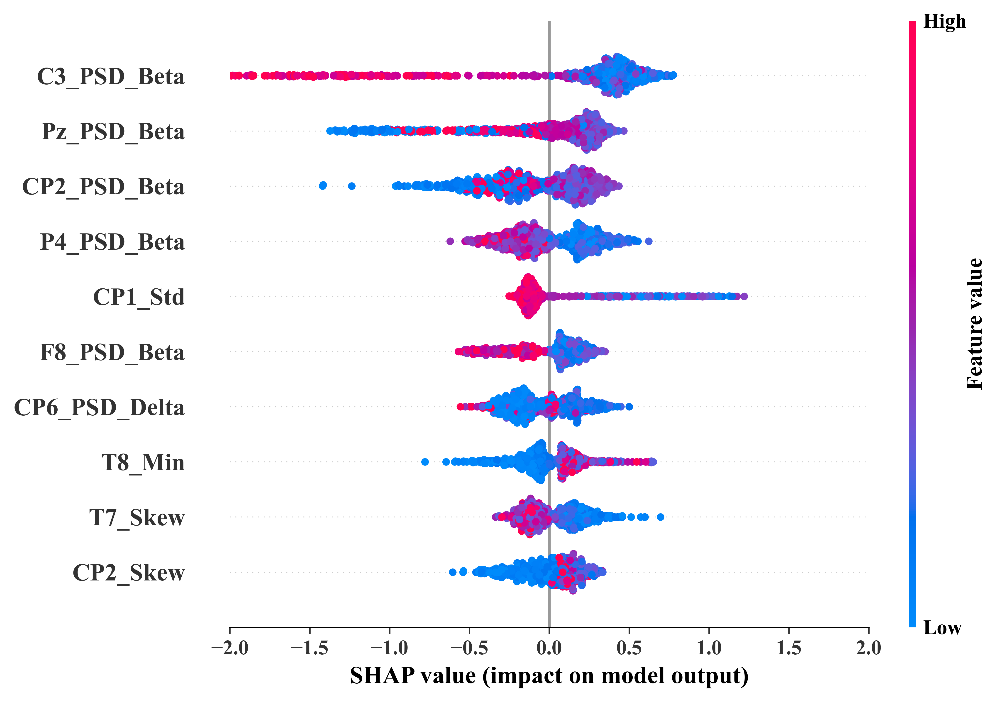

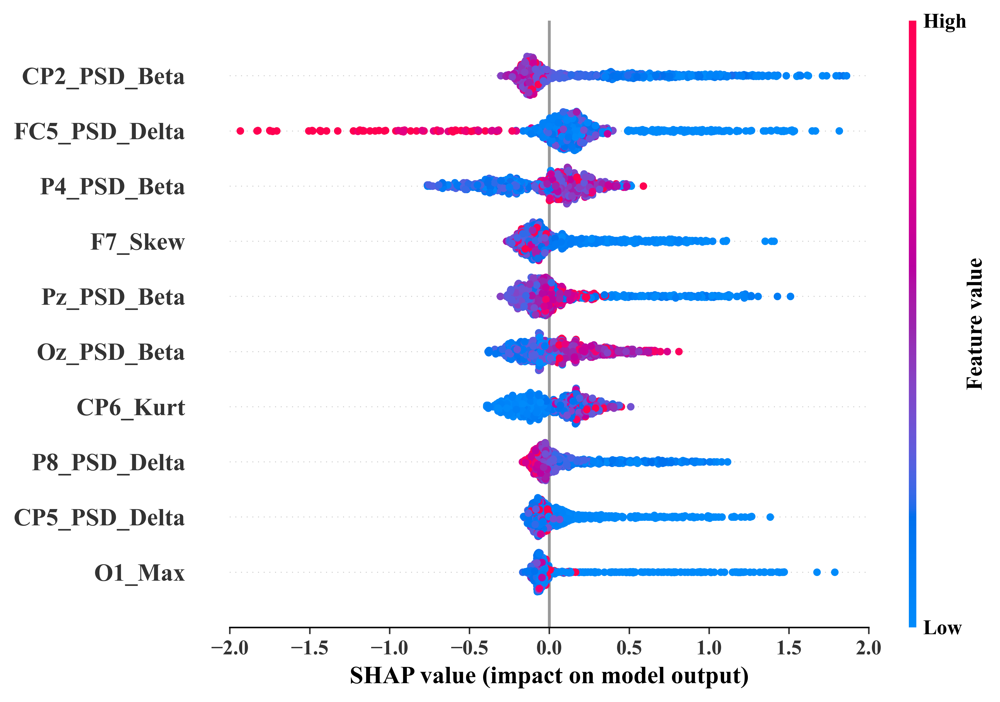

In [91]:
SHAP_summary333(LGBMModel, chEEGFeatures, TrustLabel, 'EEG')